# Imports

In [59]:
import numpy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

from PIL import Image
from imblearn.over_sampling import RandomOverSampler
from tensorflow.keras import layers, models, backend as backend
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import EarlyStopping, History
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
from collections import Counter
from typing import Tuple, Any, Optional, Dict

# Set GPU memory growth
gpus = tf.config.experimental.list_physical_devices("GPU")
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices("GPU")
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)


# Check TensorFlow version
print(f"Using TensorFlow Keras Version: {tf.keras.__version__}")
num_gpus = len(tf.config.list_physical_devices("GPU"))
print(f"GPUs Available: {num_gpus}")
print("GPU is", "available" if num_gpus > 0 else "NOT AVAILABLE")

1 Physical GPUs, 1 Logical GPUs
Using TensorFlow Keras Version: 2.10.0
GPUs Available: 1
GPU is available


# Dataset

Single,Sam, Iranmanesh,Saeid, and Raad,Raad. (2023). RealWaste. UCI Machine Learning Repository. https://doi.org/10.24432/C5SS4G.

### Prepare Data

The dataset is composed of the following labels and image counts:
  - Cardboard: 461
  - Food Organics: 411
  - Glass: 420
  - Metal: 790
  - Miscellaneous Trash: 495
  - Paper: 500
  - Plastic: 921
  - Vegetation: 436

All samples are:

    524px wide
    524px high

In [2]:
# Class Names
class_names: dict[int, str] = {
    0: "Cardboard",
    1: "Food Organic",
    2: "Glass",
    3: "Metal",
    4: "Misc.",
    5: "Paper",
    6: "Plastic",
    7: "Vegetation",
}

#### Load & Preprocess Dataset

In [3]:
# Load dataset from csv
df: pd.DataFrame = pd.read_csv(
    "/Users/djcum/OneDrive/Documents/ML Datasets/realwaste-main/RealWaste/Prepared_trash_data(2).csv"
)
# df.head()


# Return images as an array of RGB
def load_image(filepath: str) -> np.ndarray:
    """
    Loads an image from a given file path and returns it as a NumPy array (RGB).

    Args:
        filepath (str): The file path to the image.

    Returns:
        numpy.ndarray: The loaded image array (RGB).
    """

    img = Image.open(filepath)
    return np.array(img)


df["image"] = df["Picture"].apply(load_image)

# Drop the 'Picture' column
df = df.drop(columns=["Picture"])

# Move the 'Class' column to the end & rename
class_column: pd.Series = df.pop("Class")
df["class"] = class_column

# Verify the changes
print(df.head())

                                               image      class
0  [[[140, 145, 148], [139, 144, 147], [142, 147,...  Cardboard
1  [[[146, 148, 160], [147, 149, 161], [146, 150,...  Cardboard
2  [[[142, 150, 153], [143, 151, 154], [145, 153,...  Cardboard
3  [[[141, 146, 150], [141, 146, 150], [140, 145,...  Cardboard
4  [[[143, 148, 152], [143, 148, 152], [140, 145,...  Cardboard


#### Normalize Data
- Take input image and covnert it to unit8 format to resize
- Resize images to 128x128 with PIL and convert it back to a NumPy array
- Normalize the values by dividing them by 255 to give a float between 0-1
- Using LabelEncoder give each class in the column a corresponding unique int

In [4]:
# Preprocessing function
def preprocess_image(
    image: np.ndarray, target_size: tuple[int, int] = (128, 128)
) -> np.ndarray:
    """
    Preprocesses the input image by ensuring it is in uint8 format, resizing it, and normalizing the pixel values.

    Args:
        image (numpy.ndarray): The input image to preprocess.
        target_size (Tuple[int, int]): The target size to resize the image to. Defaults to (128, 128).

    Returns:
        numpy.ndarray: The preprocessed image.
    """

    # Ensure the image array is in uint8 format
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)

    # Resize image
    image = Image.fromarray(image).resize(target_size)
    image = np.array(image)

    # Normalize to values 0-1
    image = image / 255.0
    return image


# Normalize images
df["image"] = df["image"].apply(preprocess_image)

# Normalize Class column to int values
le: LabelEncoder = LabelEncoder()
df["class"] = le.fit_transform(df["class"])

print(df.head())

# Delete variables and call garbage collector
del class_column
gc.collect()

                                               image  class
0  [[[0.5607843137254902, 0.5803921568627451, 0.5...      0
1  [[[0.5411764705882353, 0.5568627450980392, 0.6...      0
2  [[[0.5529411764705883, 0.5843137254901961, 0.5...      0
3  [[[0.5490196078431373, 0.5686274509803921, 0.5...      0
4  [[[0.5529411764705883, 0.5725490196078431, 0.5...      0


0

#### Visualize Data

In [5]:
# Extract images and labels
X: np.ndarray = np.stack(df["image"].values)
y: np.ndarray = df["class"].values

print(X.shape, y.shape)

(4434, 128, 128, 3) (4434,)


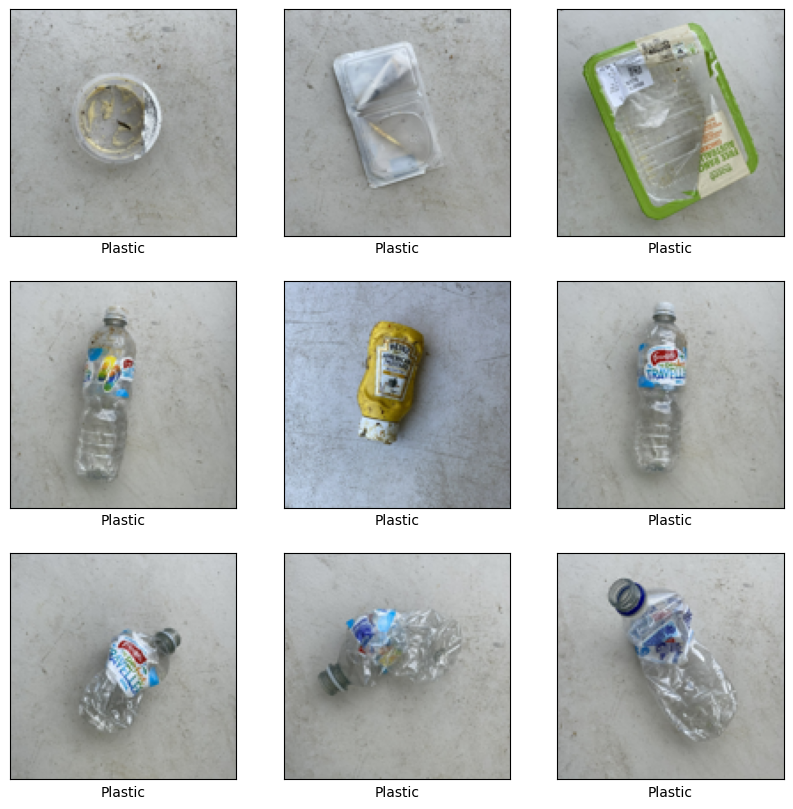

In [6]:
# select a random set of 9 images
idx: int = np.random.randint(len(X) - 9)

plt.figure(figsize=(10, 10))
for i in range(9):
    # plot each sample
    plt.subplot(3, 3, i + 1)
    plt.imshow(X[i + idx])
    label_idx = y[i + idx]  # Get the label index
    plt.xlabel(class_names[label_idx])
    plt.xticks([])
    plt.yticks([])

# display results
plt.show()

#### Shuffle and Split Data
##### Shuffle the Data
df.sample(frac=1, random_state=42) shuffles the DataFrame rows. 

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sample.html

##### Split the data into train, validation, and test sets
- X = np.stack(df['image'].values): Converts the 'image' column into a NumPy array.
- y = df['class'].values: Extracts the 'class' column into a NumPy array y, which contains the class labels.

###### First Split:
- train_test_split(X, y, test_size=0.4, stratify=y, random_state=42): Splits X and y into training and temporary sets.
     - 60% of the data goes into the training set (X_train and y_train)
     - 40% goes into the temporary set (X_temp and y_temp).

###### Second Split:
- train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42): Spits temp set into two equally sized sets of validation and test.
  
###### New Datasets:

- Training set: X_train, y_train
- Validation set: X_valid, y_valid
- Test set: X_test, y_test

In [7]:
# Shuffle the Data
df: pd.DataFrame = df.sample(frac=1, random_state=42).reset_index(drop=True)

# Split the data into train, validation, and test sets
X: np.ndarray = np.stack(df["image"].values)
y: np.ndarray = df["class"].values

# Clear the dataframe from memory
del df
gc.collect()

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, stratify=y, random_state=42
)
X_valid, X_test, y_valid, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42
)

# Verify the shapes of the splits
print(f"Train Shape: {X_train.shape}, {y_train.shape}")
print(f"Validation Shape: {X_valid.shape}, {y_valid.shape}")
print(f"Test Shape: {X_test.shape}, {y_test.shape}")

Train Shape: (2660, 128, 128, 3), (2660,)
Validation Shape: (887, 128, 128, 3), (887,)
Test Shape: (887, 128, 128, 3), (887,)


#### Scale Data Samples

###### Oversampling:
- Check for Oversampling:
if oversample:: This block executes only if oversample is set to True.
- Flatten Images for Oversampling:
X = X.reshape((X.shape[0], -1)): Reshapes X to flattened image
- Oversample the Dataset:
    - ros = RandomOverSampler(): Initializes RandomOverSampler
    - X, y = ros.fit_resample(X, y): Applies oversampling to balance the classes in X and y.
- Reshape Back to Original Dimensions:
X = X.reshape((X.shape[0], 128, 128, 3)): Reshapes X back a 4D array

In [8]:
def scale_dataset(
    X: np.ndarray, y: np.ndarray, oversample: bool = False
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Scales the dataset and optionally performs oversampling to balance the classes.

    Args:
        X (numpy.ndarray): The input features.
        y (numpy.ndarray): The target labels.
        oversample (bool): Whether to perform oversampling. Defaults to False.

    Returns:
        tuple: Scaled features and labels.
    """

    if oversample:
        print(f"Original shape: {X.shape}")  # Debug print
        print(f"Class distribution before oversampling: \n{Counter(y)}")

        X = X.reshape((X.shape[0], -1))  # Flatten images for oversampling
        print(f"Flattened shape: {X.shape}")  # Debug print

        ros = RandomOverSampler()
        X, y = ros.fit_resample(X, y)
        print(f"After oversampling shape: {X.shape}")  # Debug print

        print(f"Class distribution after oversampling: \n{Counter(y)}")

        X = X.reshape((X.shape[0], 128, 128, 3))  # Reshape back to original dimensions

    return X, y

In [9]:
X_train, y_train = scale_dataset(X_train, y_train, oversample=True)
X_valid, y_valid = scale_dataset(X_valid, y_valid, oversample=False)
X_test, y_test = scale_dataset(X_test, y_test, oversample=False)

Original shape: (2660, 128, 128, 3)
Class distribution before oversampling: 
Counter({6: 552, 3: 474, 5: 300, 4: 297, 0: 276, 7: 262, 2: 252, 1: 247})
Flattened shape: (2660, 49152)
After oversampling shape: (4416, 49152)
Class distribution after oversampling: 
Counter({2: 552, 1: 552, 6: 552, 3: 552, 4: 552, 5: 552, 0: 552, 7: 552})


#### Verify Sampling

In [10]:
print(X_train[0][0][0])
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

[0.75686275 0.80784314 0.87058824]
X_train shape: (4416, 128, 128, 3)
y_train shape: (4416,)


In [11]:
# DEBUG TO ENSURE ALL SETS ARE EQUAL SIZE. DO NOT RUN UNLESS DEBUGGING

# Convert back to df to checking class distribution
# train_df = pd.DataFrame({'image': list(X_train), 'class': y_train})
# valid_df = pd.DataFrame({'image': list(X_valid), 'class': y_valid})
# test_df = pd.DataFrame({'image': list(X_test), 'class': y_test})

# Check class distribution in the original DataFrame
# print("Original DataFrame class distribution:")
# print(df['class'].value_counts().sort_index())

# Check class distribution in the training set
# print("\nTraining set class distribution:")
# print(train_df['class'].value_counts().sort_index())
# print("\nValidation set class distribution:")
# print(valid_df['class'].value_counts().sort_index())
# print("\nTesting set class distribution:")
# print(test_df['class'].value_counts().sort_index())

# Neural Network

#### Plot Definitions

Template from: https://www.tensorflow.org/guide/basics

In [12]:
# Tensorflow plot definitions


def plot_history(history: History):
    """
    Plots the training and validation loss and accuracy.

    Args:
        history: Training history object.
    """

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # Loss
    ax1.plot(history.history["loss"], label="Training Loss")
    ax1.plot(history.history["val_loss"], label="Validation Loss")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Cross Entropy Loss")
    ax1.set_title("Train & Val Loss")
    ax1.legend()
    ax1.grid(True)

    # Accuracy
    ax2.plot(history.history["accuracy"], label="Training Accuracy")
    ax2.plot(history.history["val_accuracy"], label="Validation Accuracy")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy")
    ax2.set_title("Train & Val Accuracy")
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

#### Data Generator

Instead of loading all data into memory at once, a data generator loads data in batches. This avoids memory allocation errors. 

In [13]:
# Data Generator Class
class DataGenerator(Sequence):
    """Generates data for Keras.

    Attributes:
        X (numpy.ndarray): Array of input data.
        y (numpy.ndarray): Array of labels.
        batch_size (int): Size of each data batch.
        shuffle (bool): Whether to shuffle the data at the end of each epoch.
    """


def __init__(
    self, X: np.ndarray, y: np.ndarray, batch_size: int = 32, shuffle: bool = True
):
    self.X = X
    self.y = y
    self.batch_size = batch_size
    self.shuffle = shuffle
    self.indices = np.arange(len(self.X))
    self.on_epoch_end()


def __len__(self) -> int:
    """Denotes the number of batches per epoch."""
    return int(np.floor(len(self.X) / self.batch_size))


def __getitem__(self, index: int) -> Tuple[np.ndarray, np.ndarray]:
    """Generate one batch of data."""
    batch_indices: np.ndarray = self.indices[
        index * self.batch_size : (index + 1) * self.batch_size
    ]
    X_batch: np.ndarray = self.X[batch_indices]
    y_batch: np.ndarray = self.y[batch_indices]
    return X_batch, y_batch


def on_epoch_end(self) -> None:
    """Updates indices after each epoch."""
    if self.shuffle:
        np.random.shuffle(self.indices)

### Layers

###### Input Shape:
- tf.keras.Input(shape=(128, 128, 3)): Resizes inputs to 128x128

###### Conv2D Layers:
- Increased the depth progressively from 32 to 256 filters. This layer ensures the model can detect patterns and features in images by applying filters that scan across the input image. Conv2D is a well known tool for image classification. 

    https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D

###### MaxPooling2D Layers:
- Pool size of (2, 2) after each Conv2D layer to reduce computational load by downsampling by taking the maximum value of smaller regions.

    https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D

###### Dropout Layers:
- Dropout probability of 0.5 to prevent overfitting by randomly dropping units during training. Dropout randomly drops neurons which prevents the model from relying on specific neurons. 

    https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout

###### Dense Layers:
- Dense layers connect all neurons from a previous layer to all neurons in a current layer. Also known as the "Fully Connected Layer"
  
    https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense
  
    - Dense(256, activation='relu')
        - ReLU activation introduces non-linearity
          
          https://www.tensorflow.org/api_docs/python/tf/keras/activations/relu
    - Dense(8, activation='softmax')
        - Softmax activation converts raw outputs into probabilities that sum to 100%. Popular and useful for multiclass classification.
          
          https://www.tensorflow.org/api_docs/python/tf/keras/activations/softmax

###### Optimizer:
- tf.keras.optimizers.Adam(learning_rate): Updates the weights of a neural network by combining the benefits of AdaGrad and RMSProp. Results in a faster and more reliable training model. 

  https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam

###### Early Stopping:
- tf.keras.callbacks.EarlyStopping: Stops the training for the current cycle if validation loss is not improving.

  https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [14]:
# Define the training model
def train_model(
    train_gen: ImageDataGenerator,
    val_gen: ImageDataGenerator,
    steps_per_epoch: int,
    validation_steps: int,
    num_nodes: int,
    dropout_prob: float,
    learning_rate: float,
    epochs: int,
) -> Tuple[models.Model, History]:
    """
    Trains the CNN model with the given parameters and data.

    Args:
        train_gen (ImageDataGenerator): Training data generator.
        val_gen (ImageDataGenerator): Validation data generator.
        steps_per_epoch (int): Number of steps per epoch.
        validation_steps (int): Number of validation steps.
        num_nodes (int): Number of nodes in the fully connected layer.
        dropout_prob (float): Dropout probability for regularization.
        learning_rate (float): Learning rate for the optimizer.
        epochs (int): Number of epochs to train the model.

    Returns:
        model: The trained Keras model.
        history: Training history object.
    """

    model = tf.keras.Sequential(
        [
            tf.keras.Input(shape=(128, 128, 3)),
            # First Convolutional layer
            layers.Conv2D(32, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Dropout to avoid overfitting
            layers.Dropout(dropout_prob),
            # Second Convolutional layer
            layers.Conv2D(64, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Third Convolutional layer
            layers.Conv2D(128, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Fourth Convolutional layer
            layers.Conv2D(256, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Flatten to transition from convoluted layers to connected layers
            layers.Flatten(),
            # Fully connected layer with relu activation
            layers.Dense(num_nodes, activation="relu"),
            # Dropout to avoid overfitting, regularizes after dense layer
            layers.Dropout(dropout_prob),
            layers.Dense(8, activation="softmax"),
        ]
    )

    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )

    # Early stopping
    early_stopping = EarlyStopping(
        monitor="val_loss", patience=10, restore_best_weights=True
    )

    # Train the model with data augmentation
    history = model.fit(
        train_gen,
        steps_per_epoch=steps_per_epoch,
        epochs=epochs,
        validation_data=val_gen,
        validation_steps=validation_steps,
        callbacks=[early_stopping],
        verbose=0,
    )

    return model, history

In [60]:
# Define build_model for k-fold validation
def build_model(
    num_nodes: int = 64, dropout_prob: float = 0.3, learning_rate: float = 0.0001
) -> models.Model:
    """
    Builds and compiles a Keras model.

    Args:
        num_nodes (int): Number of nodes in the dense layer.
        dropout_prob (float): Dropout probability.
        learning_rate (float): Learning rate for the optimizer.

    Returns:
        model: A compiled Keras model.
    """
    model = models.Sequential(
        [
            # First Convolutional layer
            layers.Conv2D(
                32, 3, activation="relu", padding="same", input_shape=(128, 128, 3)
            ),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Dropout to avoid overfitting
            layers.Dropout(dropout_prob),
            # Second Convolutional layer
            layers.Conv2D(64, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Third Convolutional layer
            layers.Conv2D(128, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Fourth Convolutional layer
            layers.Conv2D(256, 3, activation="relu", padding="same"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(pool_size=(2, 2)),
            # Flatten to transition from convoluted layers to connected layers
            layers.Flatten(),
            # Fully connected layer with relu activation
            layers.Dense(num_nodes, activation="relu"),
            # Dropout to avoid overfitting, regularizes after dense layer
            layers.Dropout(dropout_prob),
            layers.Dense(8, activation="softmax"),
        ]
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )

    return model

### Training the model

In [34]:
# Find best model
def find_best_model(
    X_train: np.ndarray,
    y_train: np.ndarray,
    X_valid: np.ndarray,
    y_valid: np.ndarray,
    X_test: np.ndarray,
    y_test: np.ndarray,
    epochs: int = 100,
) -> Tuple[Optional[models.Model], Optional[History], float, float]:
    """
    Finds the best model by training with various hyperparameters.

    Args:
        X_train (numpy.ndarray): Training images.
        y_train (numpy.ndarray): Training labels.
        X_valid (numpy.ndarray): Validation images.
        y_valid (numpy.ndarray): Validation labels.
        X_test (numpy.ndarray): Testing images.
        y_test (numpy.ndarray): Testing labels.
        epochs (int): Number of epochs to train the model. Defaults to 100.

    Returns:
        best_model: The best trained model.
        best_history: Training history of the best model.
        best_test_loss (float): Test loss of the best model.
        best_test_accuracy (float): Test accuracy of the best model.
    """

    least_validation_loss: float = float("inf")
    least_loss_model: Optional[models.Model] = None
    best_history: Optional[History] = None

    # Parameters
    num_nodes_list = [32, 64, 128]
    dropout_prob_list = [0.2, 0.3, 0.4]
    learning_rate_list = [0.0001, 0.001, 0.01]
    batch_size_list = [16, 32, 128]

    for num_nodes in num_nodes_list:
        for dropout_prob in dropout_prob_list:
            for learning_rate in learning_rate_list:
                for batch_size in batch_size_list:
                    print(
                        f"\n\nNodes: {num_nodes}, Dropout: {dropout_prob}, Learning Rate: {learning_rate}, Batch Size: {batch_size}"
                    )

                    # Create data generators
                    train_gen = DataGenerator(X_train, y_train, batch_size=batch_size)
                    val_gen = DataGenerator(X_valid, y_valid, batch_size=batch_size)

                    steps_per_epoch = len(X_train) // batch_size
                    validation_steps = len(X_valid) // batch_size

                    model, history = train_model(
                        train_gen,
                        val_gen,
                        steps_per_epoch,
                        validation_steps,
                        num_nodes,
                        dropout_prob,
                        learning_rate,
                        epochs,
                    )

                    plot_history(history)

                    val_loss = model.evaluate(val_gen, steps=validation_steps)[0]

                    if val_loss < least_validation_loss:
                        least_validation_loss = val_loss
                        least_loss_model = model
                        best_history = history

                    # Delete data generators and collect garbage
                    del train_gen, val_gen
                    gc.collect()

    # Evaluate the best model on the test data
    test_gen = DataGenerator(X_test, y_test, batch_size=batch_size)
    test_loss, test_accuracy = least_loss_model.evaluate(
        test_gen, steps=len(X_test) // batch_size, verbose=0
    )

    # Delete test data generator and collect garbage
    del test_gen
    gc.collect()

    print(f"Best validation loss: {least_validation_loss:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")
    return least_loss_model, best_history, test_loss, test_accuracy



Nodes: 32, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 16


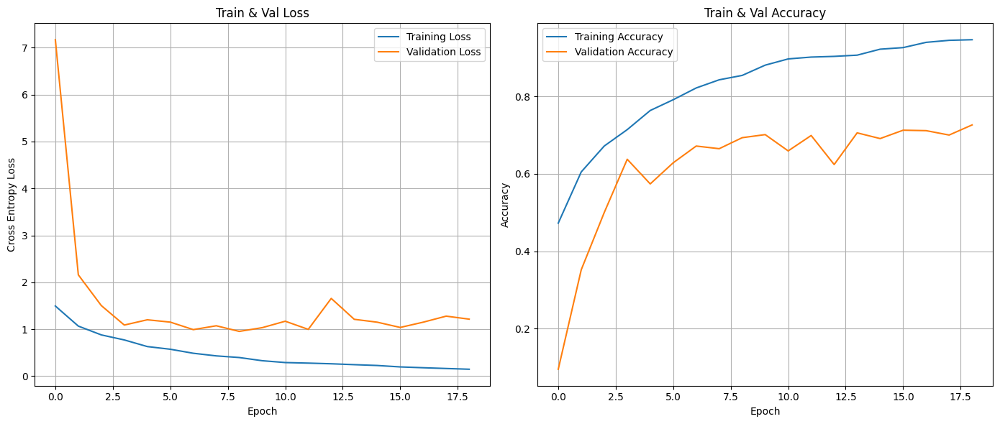

55/55 [==============================] - 0s 4ms/step - loss: 0.9534 - accuracy: 0.6955


Nodes: 32, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 32


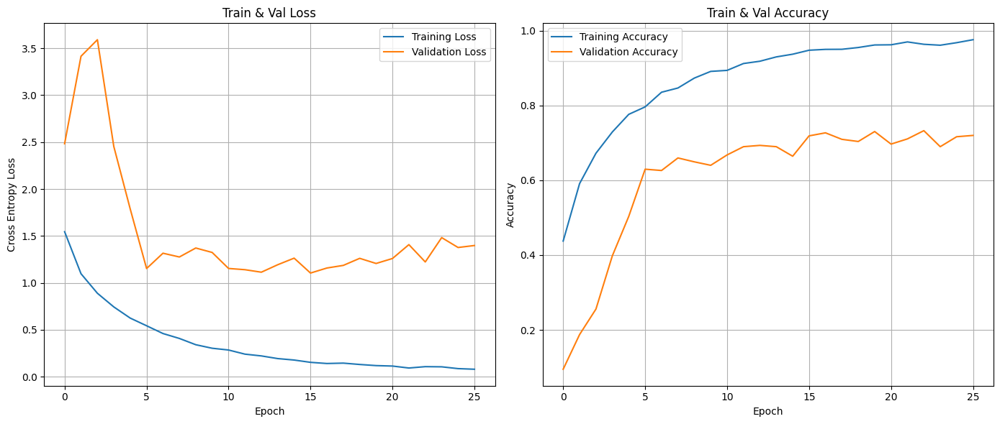

27/27 [==============================] - 0s 6ms/step - loss: 1.0786 - accuracy: 0.7234


Nodes: 32, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 128


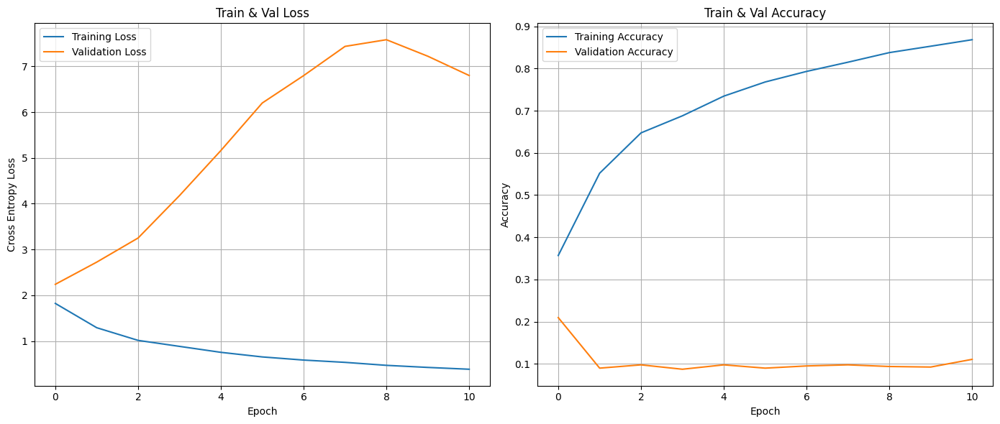

6/6 [==============================] - 0s 20ms/step - loss: 2.2282 - accuracy: 0.2044


Nodes: 32, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 16


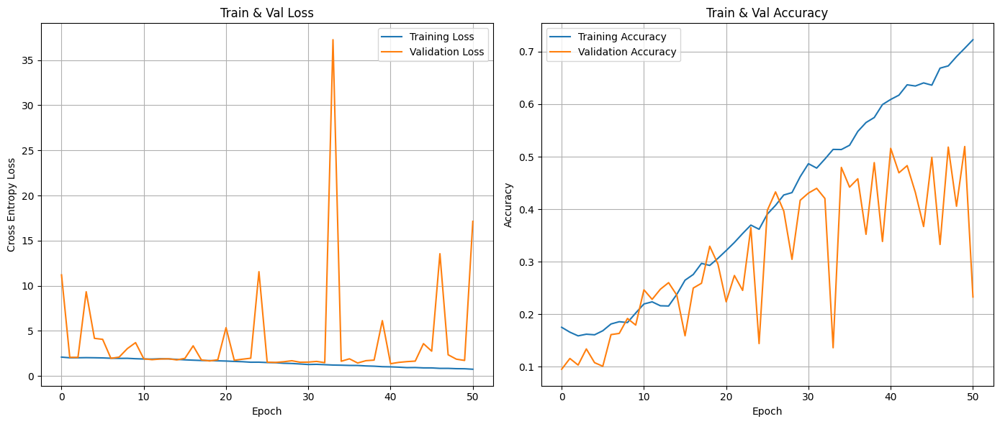

55/55 [==============================] - 0s 4ms/step - loss: 1.3558 - accuracy: 0.5170


Nodes: 32, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 32


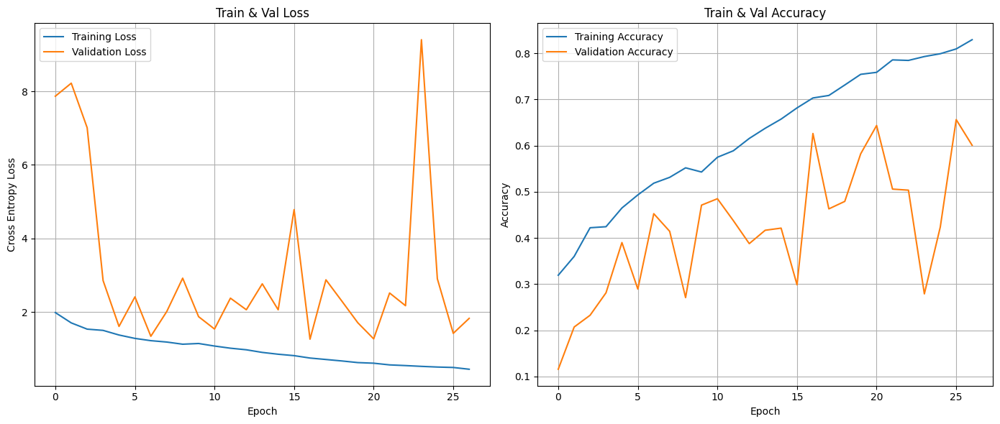

27/27 [==============================] - 0s 6ms/step - loss: 1.2638 - accuracy: 0.6238


Nodes: 32, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 128


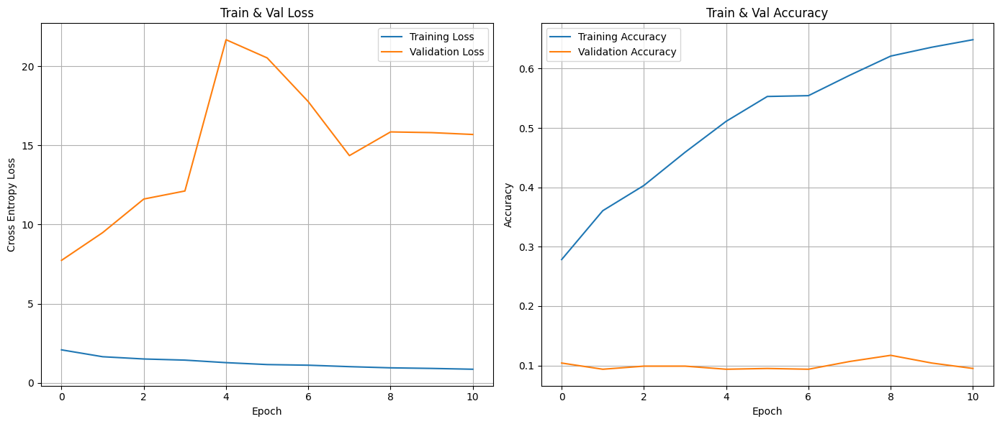

6/6 [==============================] - 0s 20ms/step - loss: 7.6747 - accuracy: 0.1016


Nodes: 32, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 16


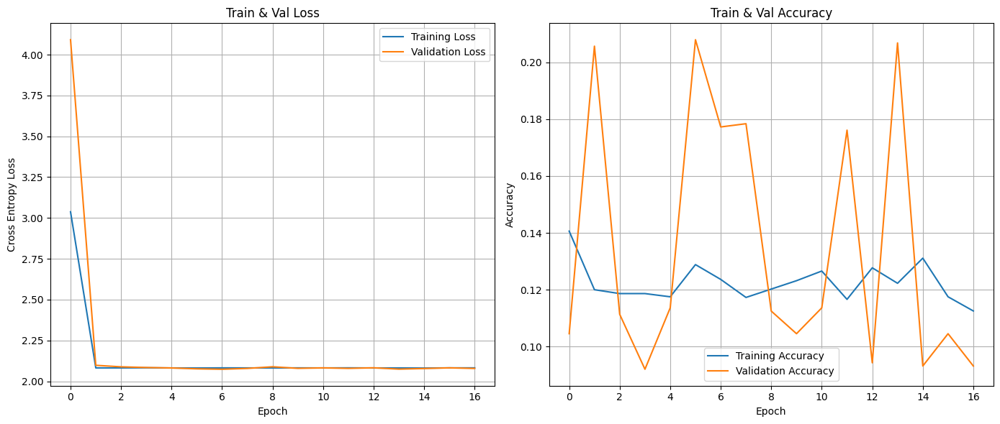

55/55 [==============================] - 0s 4ms/step - loss: 2.0735 - accuracy: 0.1784


Nodes: 32, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 32


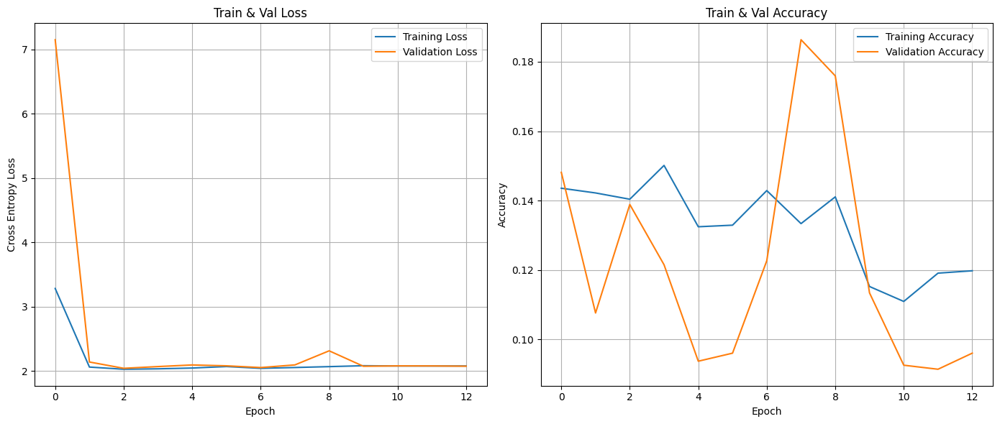

27/27 [==============================] - 0s 6ms/step - loss: 2.0568 - accuracy: 0.1412


Nodes: 32, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 128


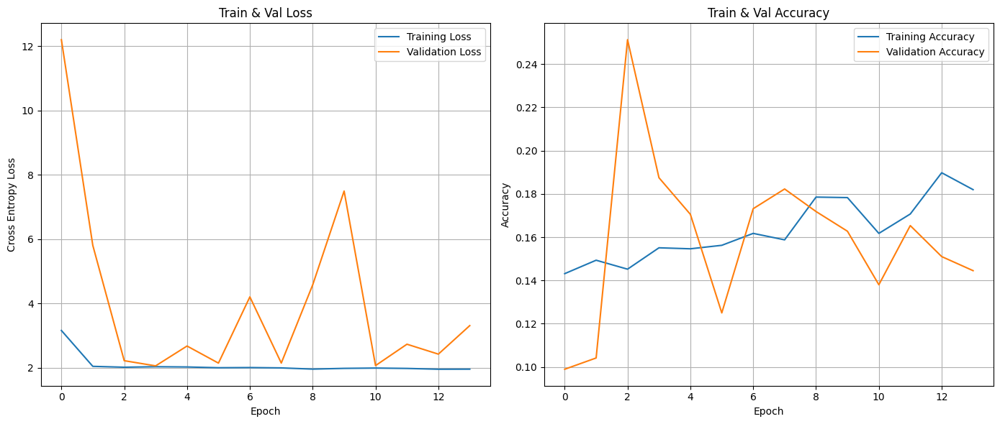

6/6 [==============================] - 0s 20ms/step - loss: 2.0471 - accuracy: 0.1875


Nodes: 32, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 16


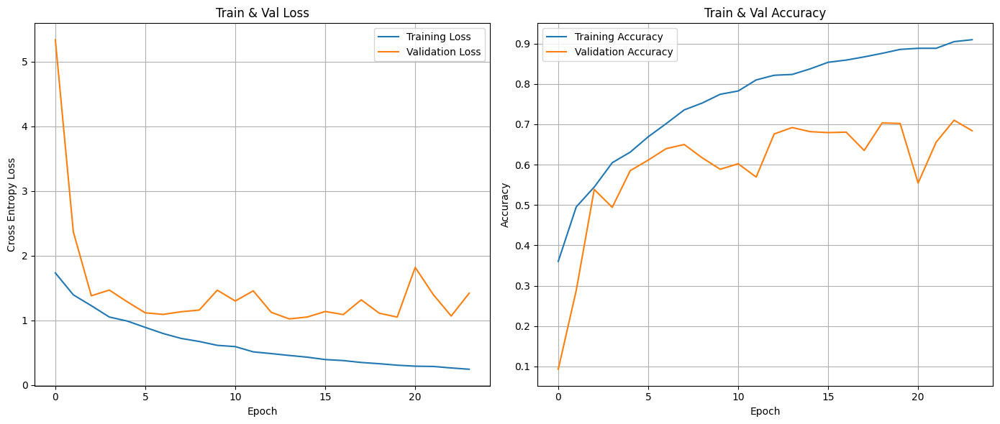

55/55 [==============================] - 0s 4ms/step - loss: 1.0237 - accuracy: 0.6943


Nodes: 32, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 32


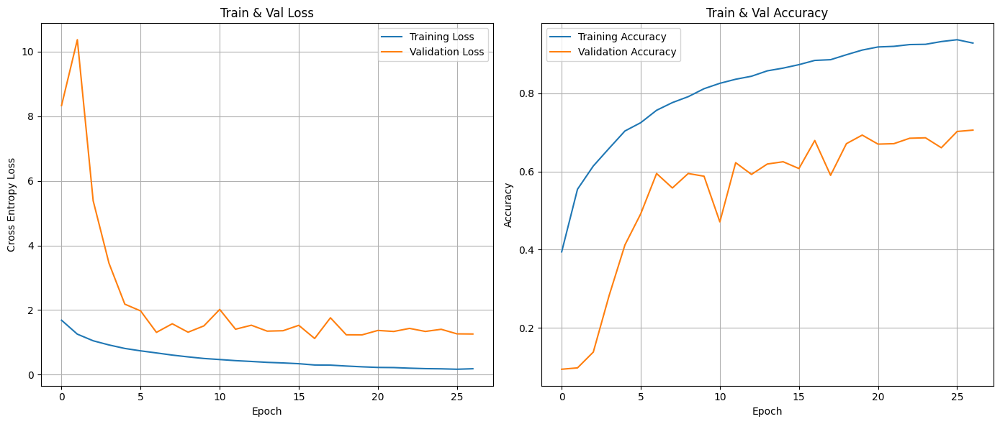

27/27 [==============================] - 0s 6ms/step - loss: 1.1216 - accuracy: 0.6782


Nodes: 32, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 128


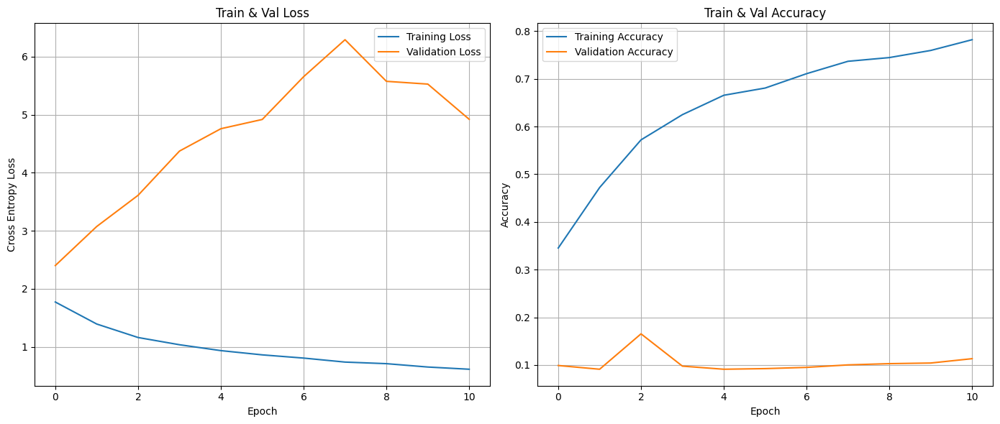

6/6 [==============================] - 0s 20ms/step - loss: 2.3938 - accuracy: 0.0964


Nodes: 32, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 16


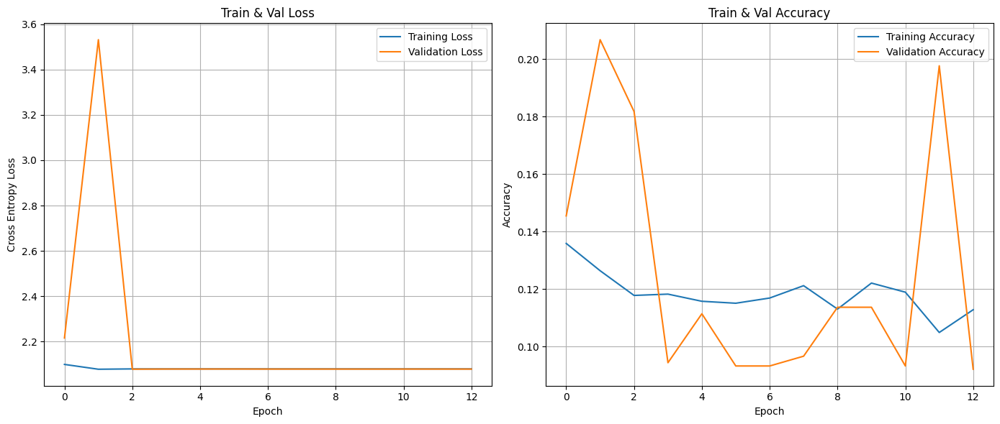

55/55 [==============================] - 0s 4ms/step - loss: 2.0785 - accuracy: 0.1830


Nodes: 32, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 32


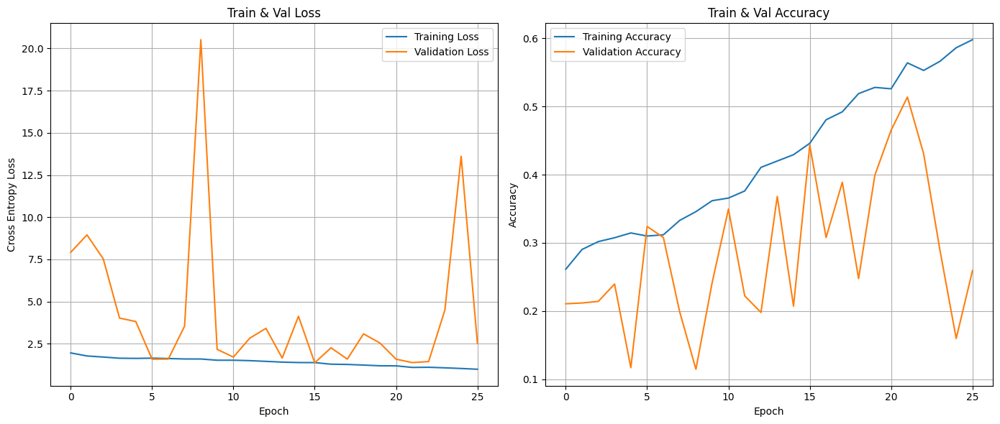

27/27 [==============================] - 0s 6ms/step - loss: 1.3791 - accuracy: 0.4468


Nodes: 32, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 128


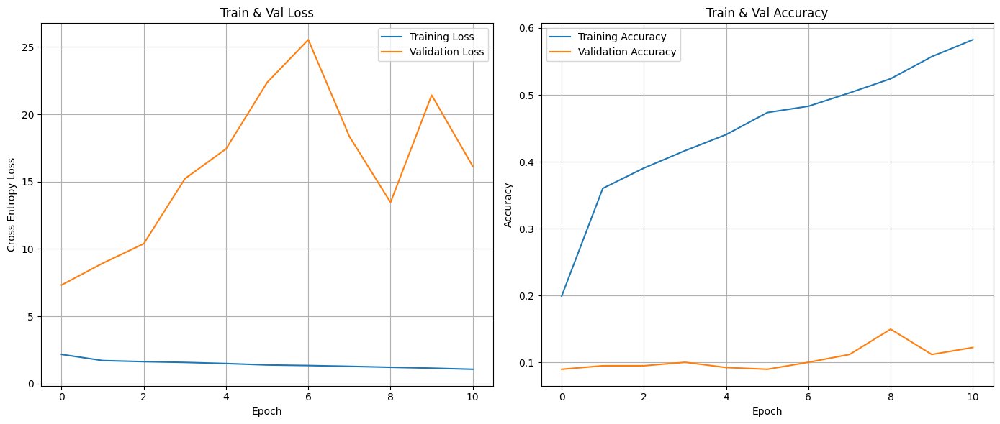

6/6 [==============================] - 0s 20ms/step - loss: 7.3362 - accuracy: 0.1016


Nodes: 32, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 16


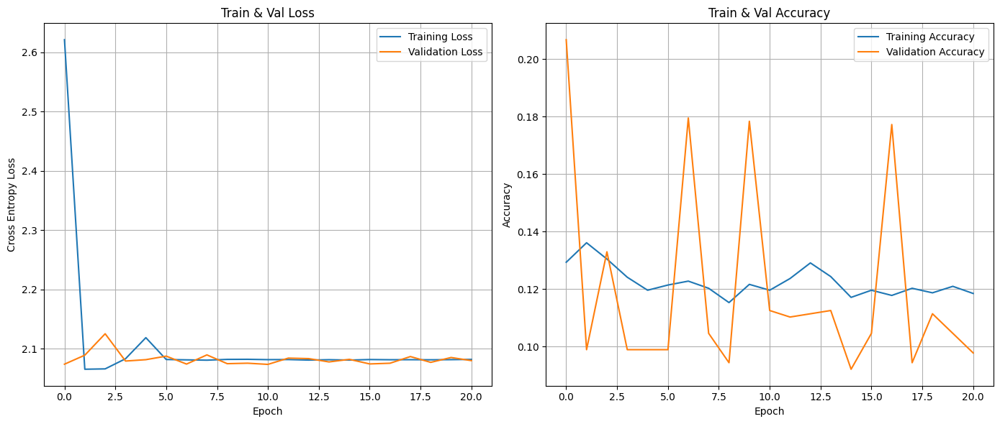

55/55 [==============================] - 0s 4ms/step - loss: 2.0739 - accuracy: 0.1136


Nodes: 32, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 32


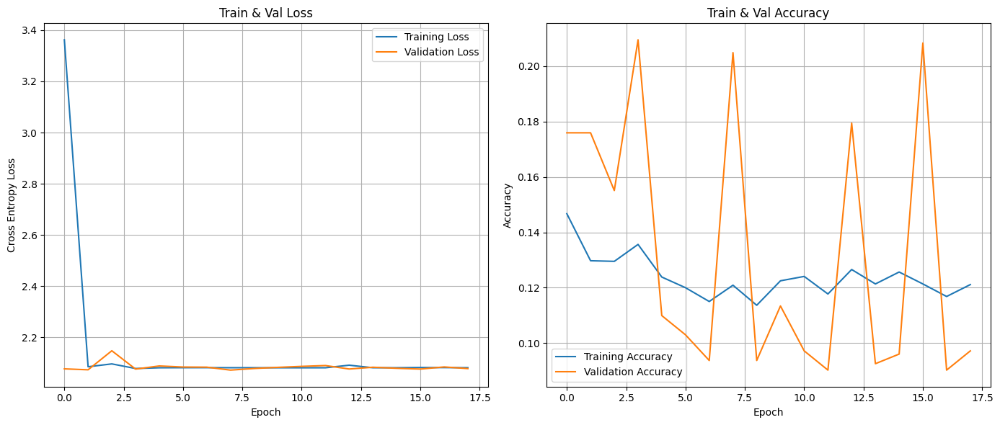

27/27 [==============================] - 0s 6ms/step - loss: 2.0715 - accuracy: 0.2095


Nodes: 32, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 128


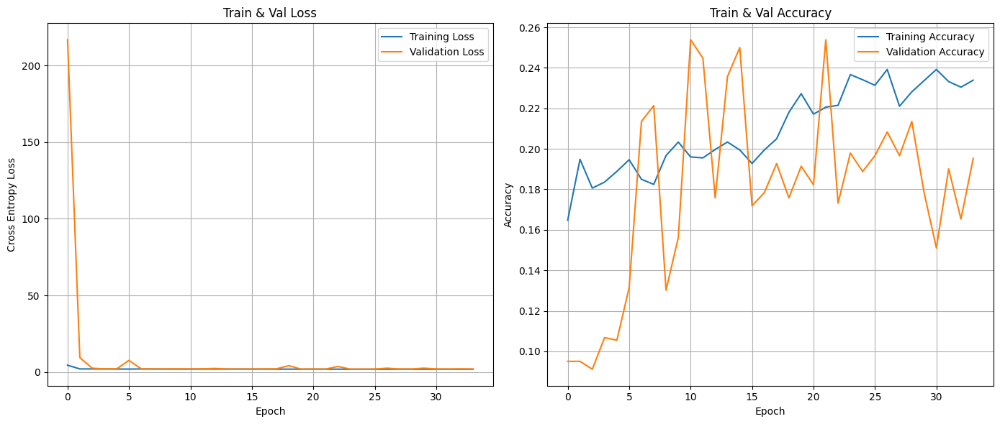

6/6 [==============================] - 0s 20ms/step - loss: 1.9276 - accuracy: 0.1901


Nodes: 32, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 16


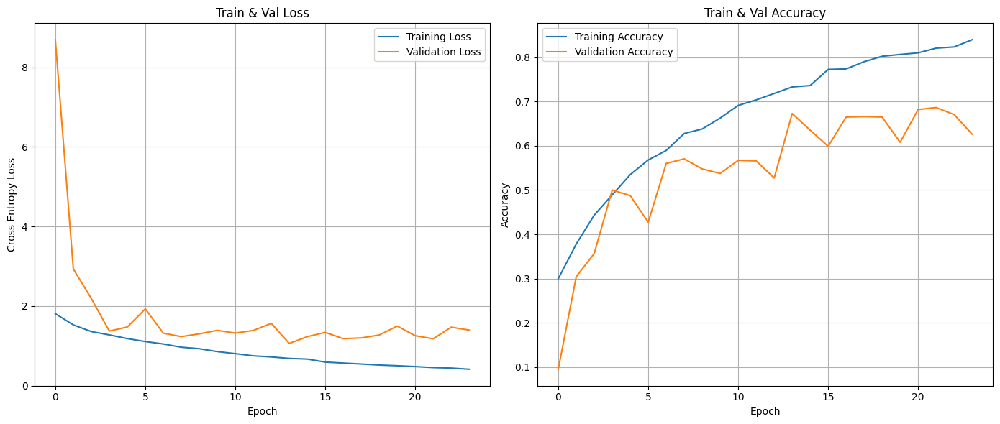

55/55 [==============================] - 0s 4ms/step - loss: 1.0598 - accuracy: 0.6727


Nodes: 32, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 32


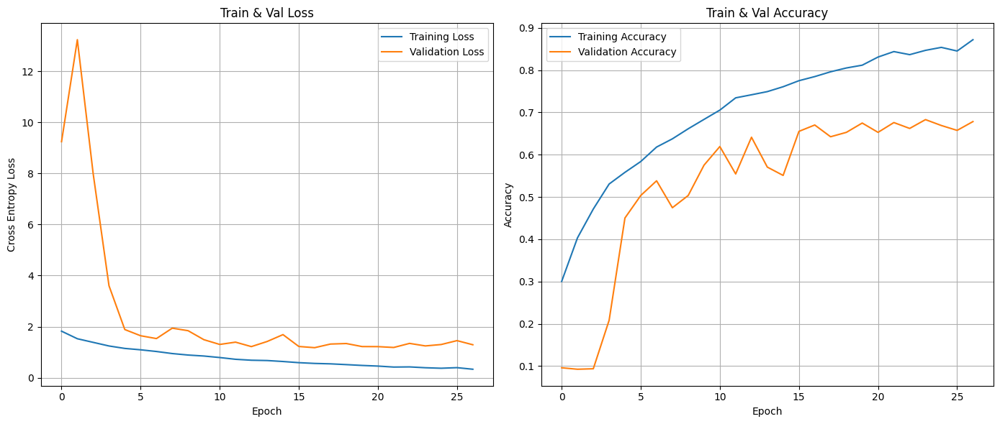

27/27 [==============================] - 0s 6ms/step - loss: 1.1743 - accuracy: 0.6736


Nodes: 32, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 128


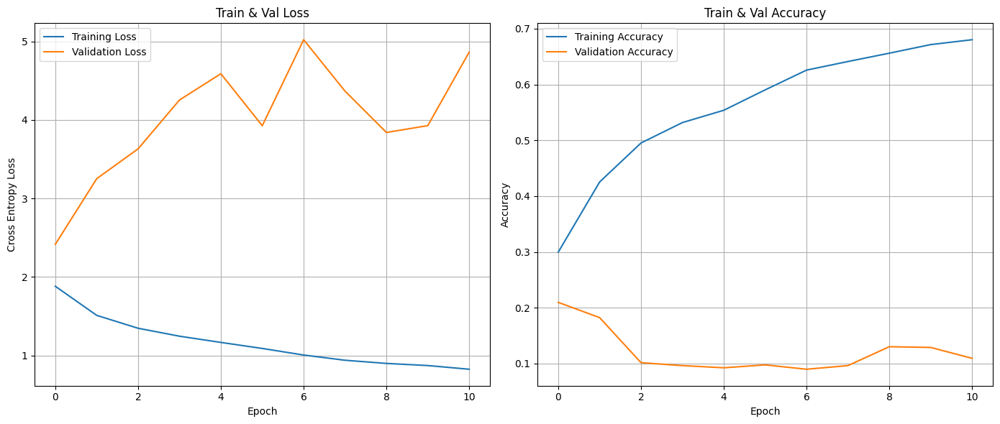

6/6 [==============================] - 0s 20ms/step - loss: 2.4015 - accuracy: 0.2122


Nodes: 32, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 16


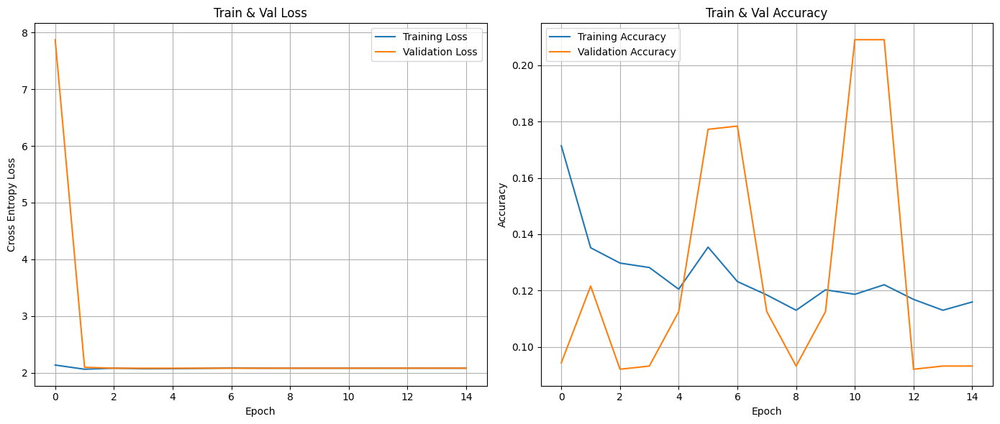

55/55 [==============================] - 0s 4ms/step - loss: 2.0785 - accuracy: 0.1114


Nodes: 32, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 32


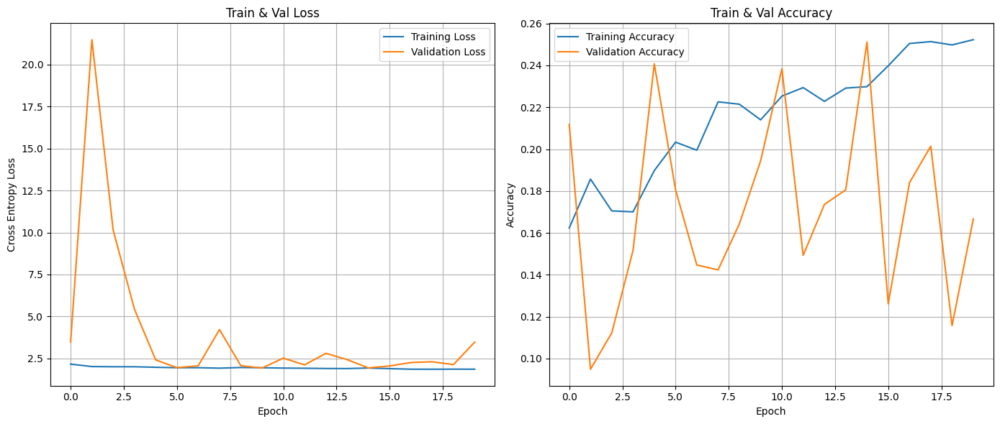

27/27 [==============================] - 0s 6ms/step - loss: 1.9296 - accuracy: 0.1944


Nodes: 32, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 128


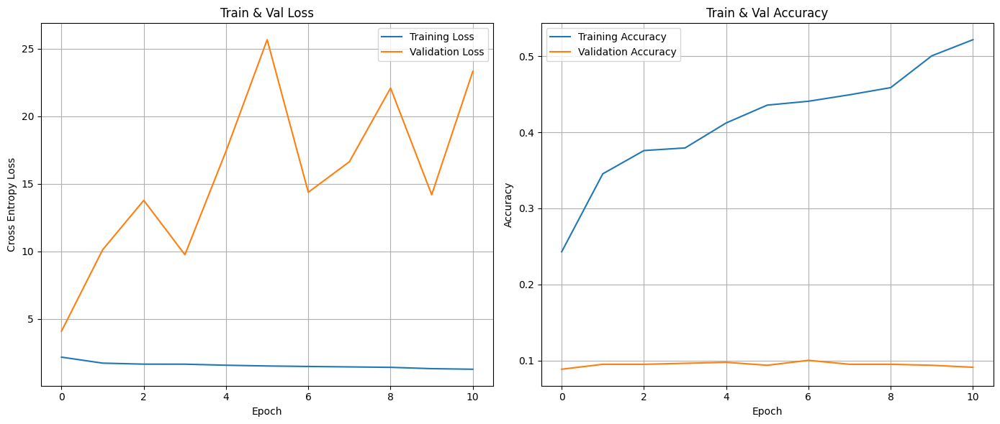

6/6 [==============================] - 0s 20ms/step - loss: 4.0779 - accuracy: 0.0938


Nodes: 32, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 16


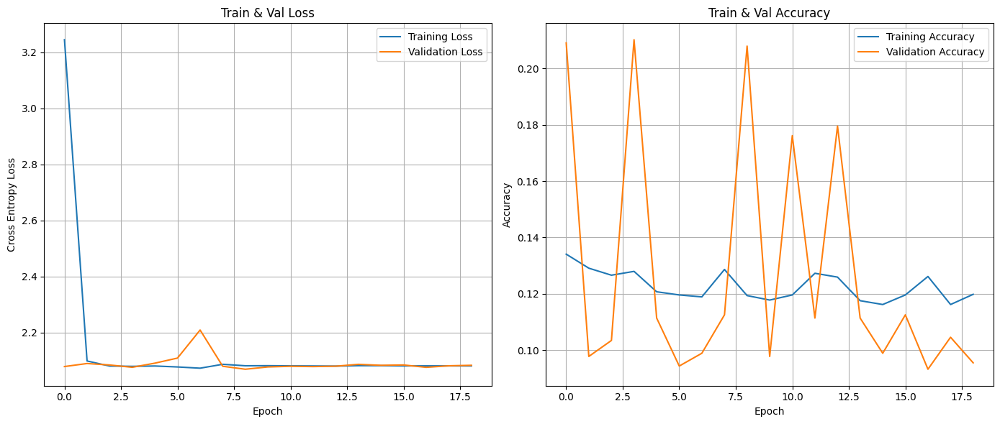

55/55 [==============================] - 0s 4ms/step - loss: 2.0694 - accuracy: 0.2091


Nodes: 32, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 32


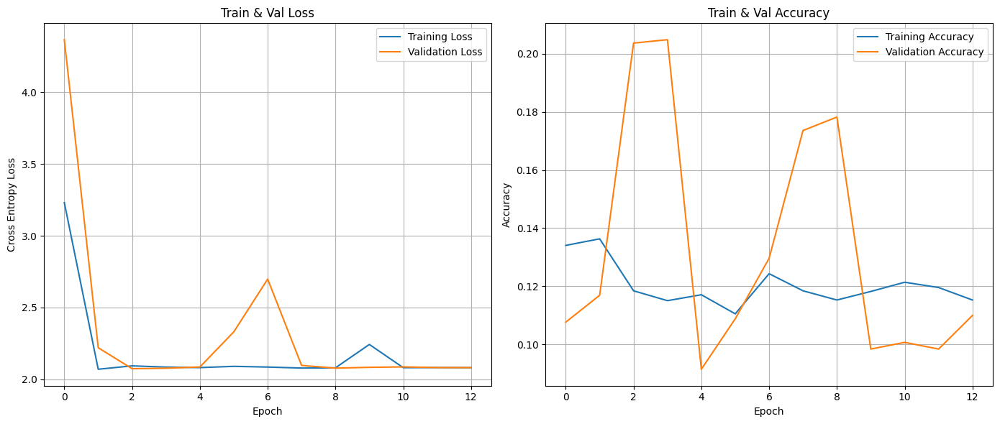

27/27 [==============================] - 0s 6ms/step - loss: 2.0729 - accuracy: 0.2095


Nodes: 32, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 128


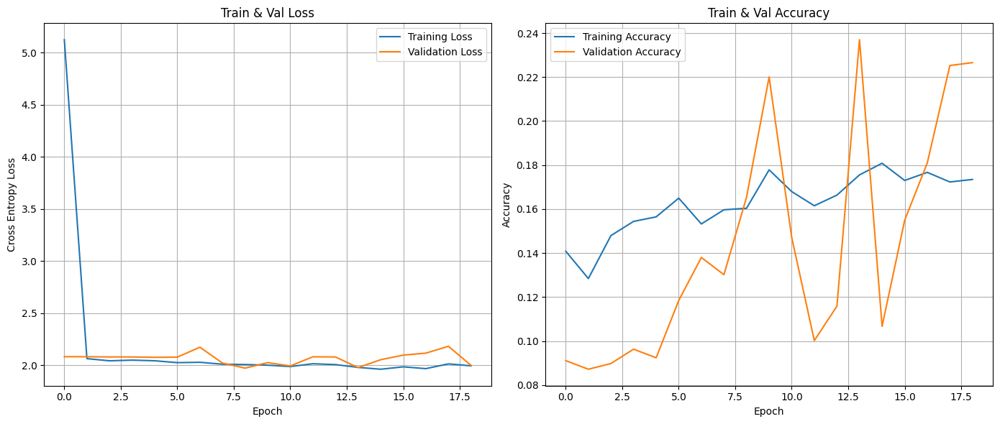

6/6 [==============================] - 0s 20ms/step - loss: 1.9881 - accuracy: 0.1523


Nodes: 64, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 16


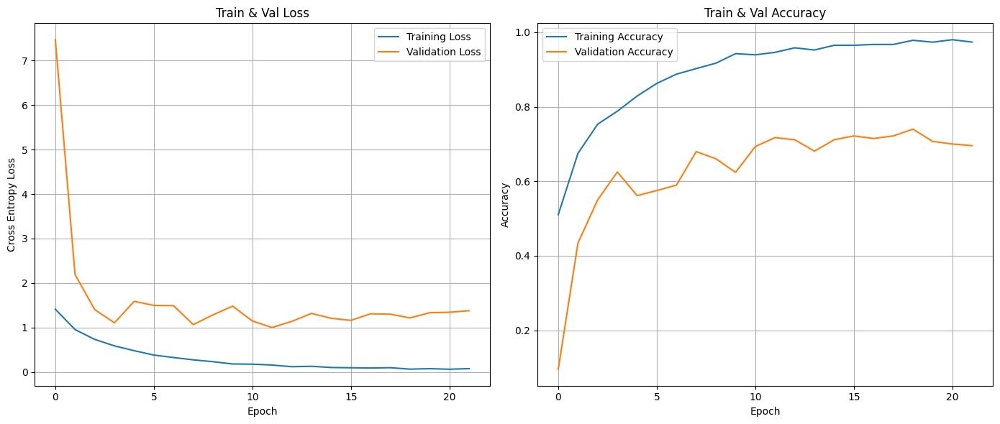

55/55 [==============================] - 0s 4ms/step - loss: 1.0052 - accuracy: 0.7159


Nodes: 64, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 32


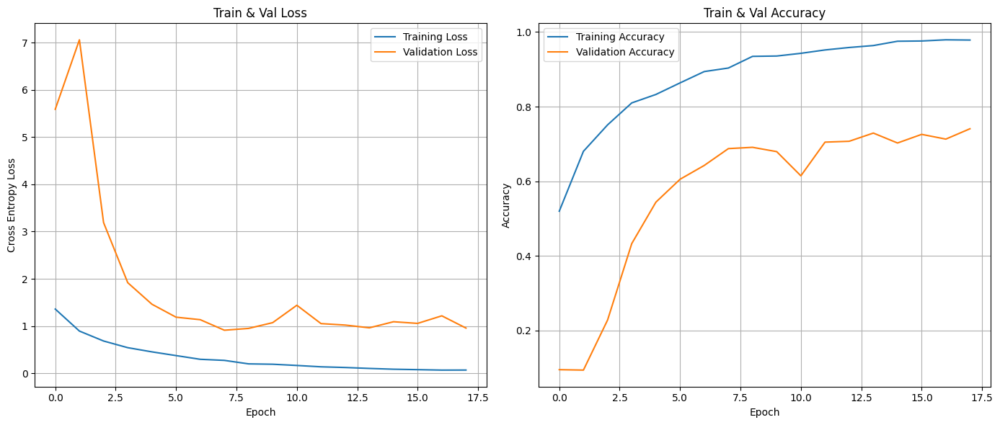

27/27 [==============================] - 0s 6ms/step - loss: 0.9323 - accuracy: 0.6829


Nodes: 64, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 128


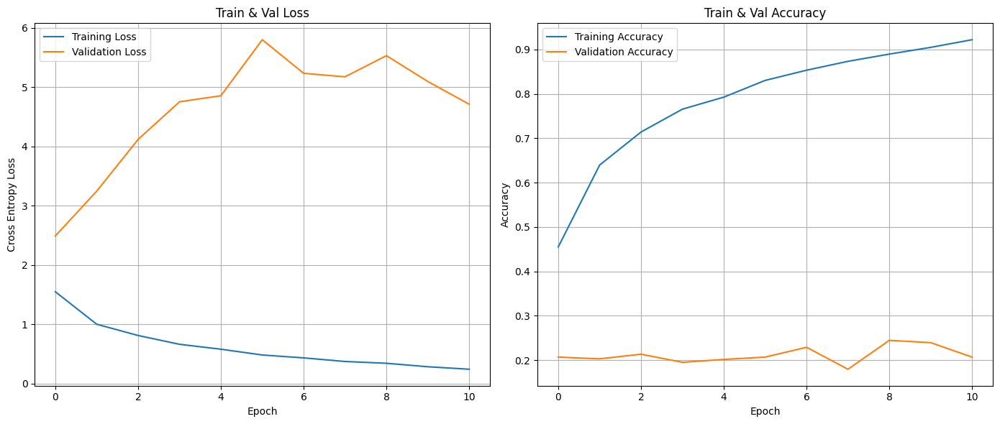

6/6 [==============================] - 0s 20ms/step - loss: 2.4818 - accuracy: 0.2005


Nodes: 64, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 16


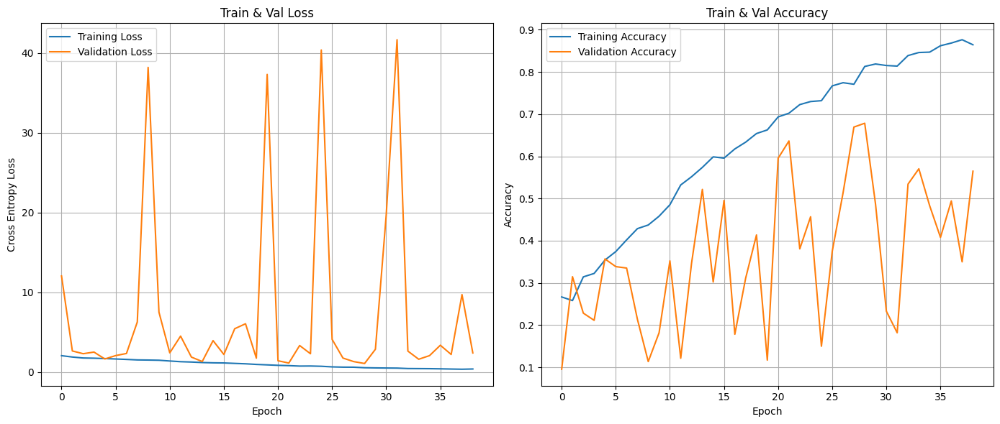

55/55 [==============================] - 0s 4ms/step - loss: 1.0642 - accuracy: 0.6818


Nodes: 64, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 32


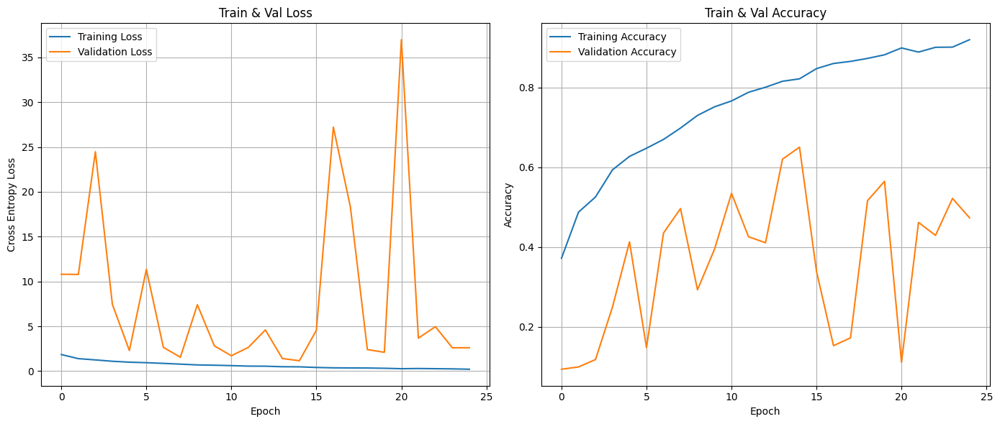

27/27 [==============================] - 0s 6ms/step - loss: 1.1738 - accuracy: 0.6505


Nodes: 64, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 128


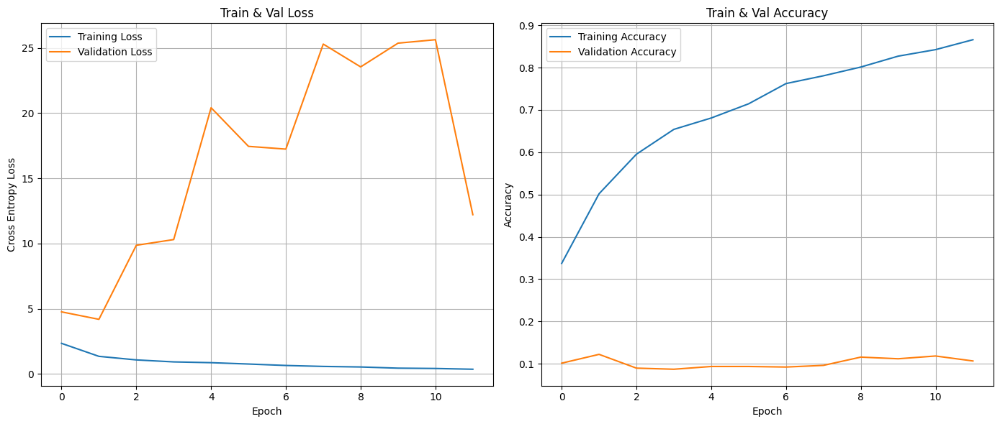

6/6 [==============================] - 0s 20ms/step - loss: 4.1661 - accuracy: 0.1211


Nodes: 64, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 16


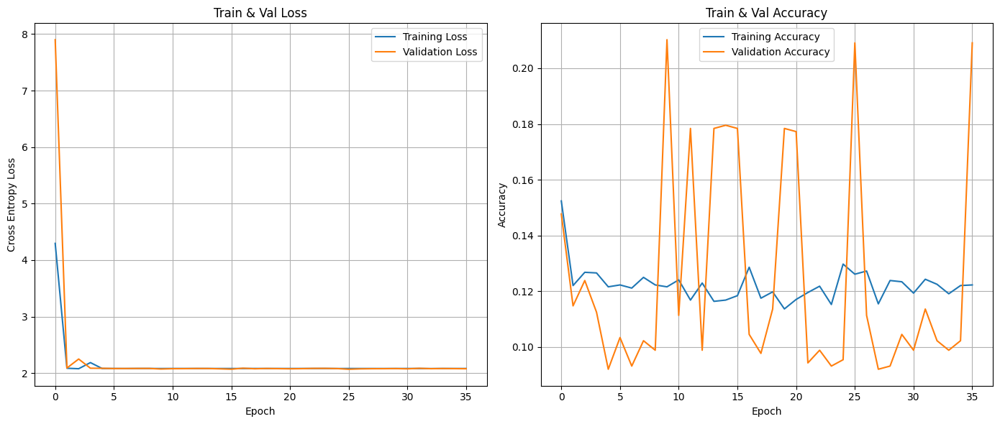

55/55 [==============================] - 0s 4ms/step - loss: 2.0685 - accuracy: 0.2091


Nodes: 64, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 32


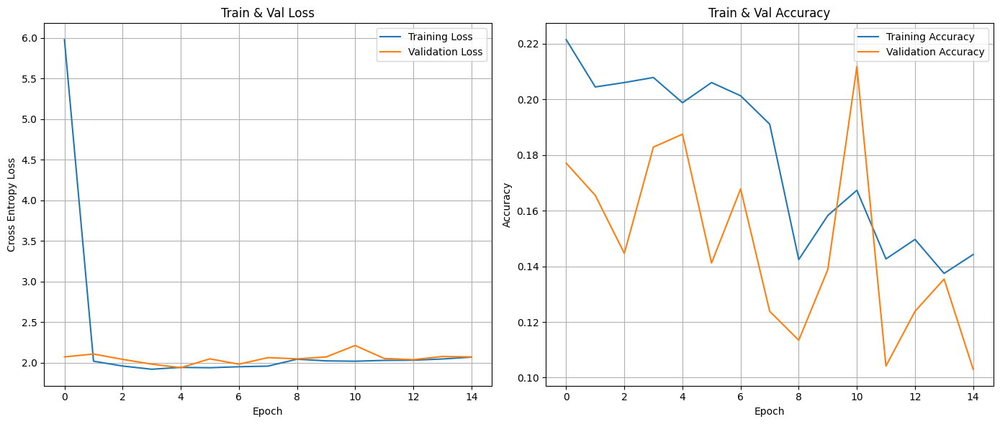

27/27 [==============================] - 0s 6ms/step - loss: 1.9361 - accuracy: 0.1863


Nodes: 64, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 128


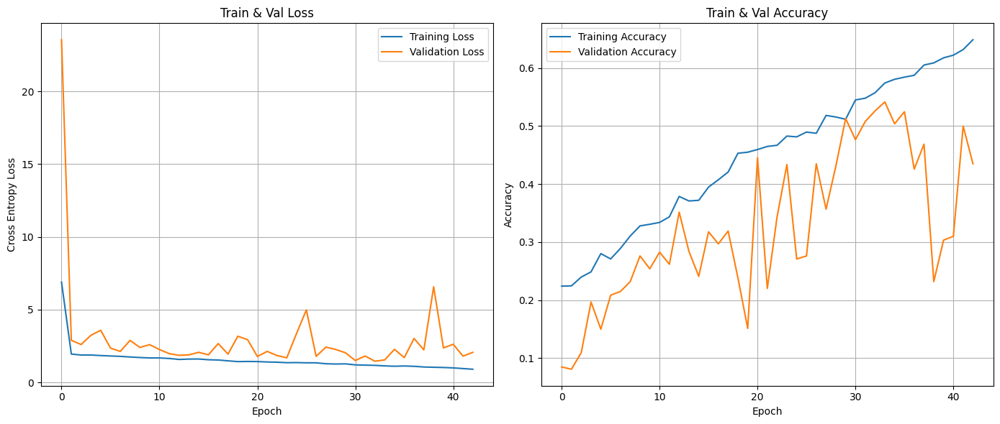

6/6 [==============================] - 0s 20ms/step - loss: 1.4351 - accuracy: 0.5352


Nodes: 64, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 16


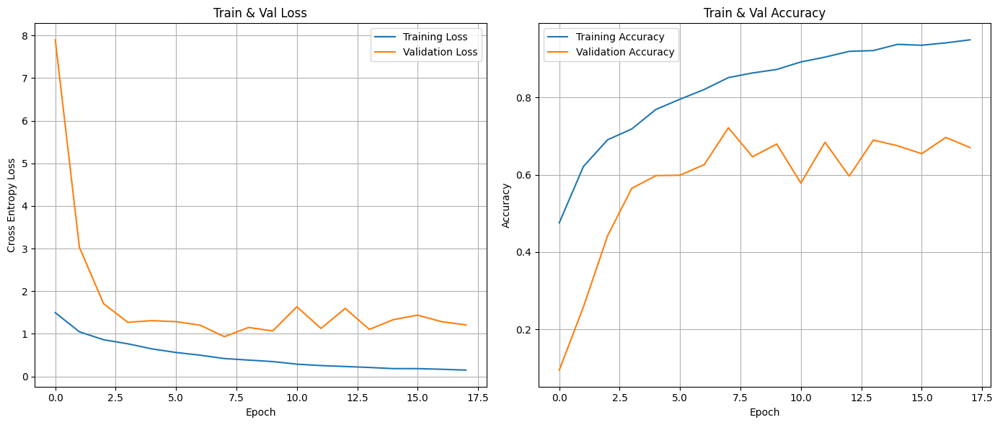

55/55 [==============================] - 0s 4ms/step - loss: 0.9305 - accuracy: 0.7227


Nodes: 64, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 32


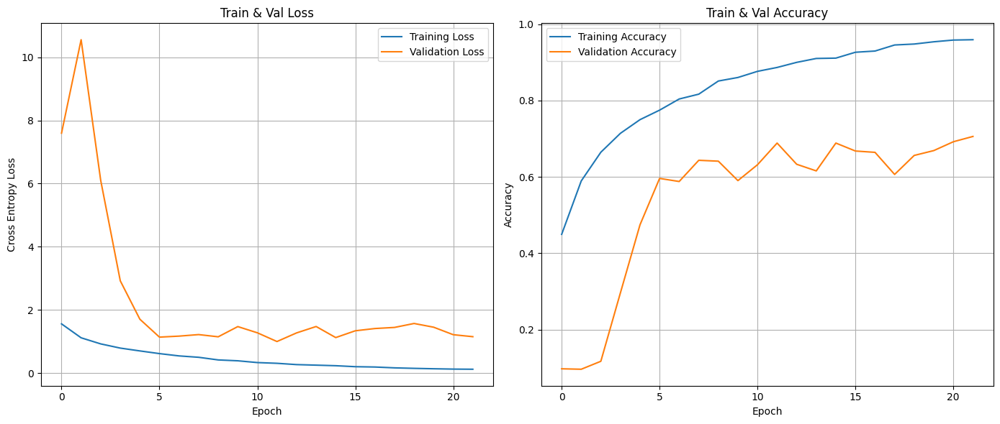

27/27 [==============================] - 0s 6ms/step - loss: 0.9982 - accuracy: 0.6887


Nodes: 64, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 128


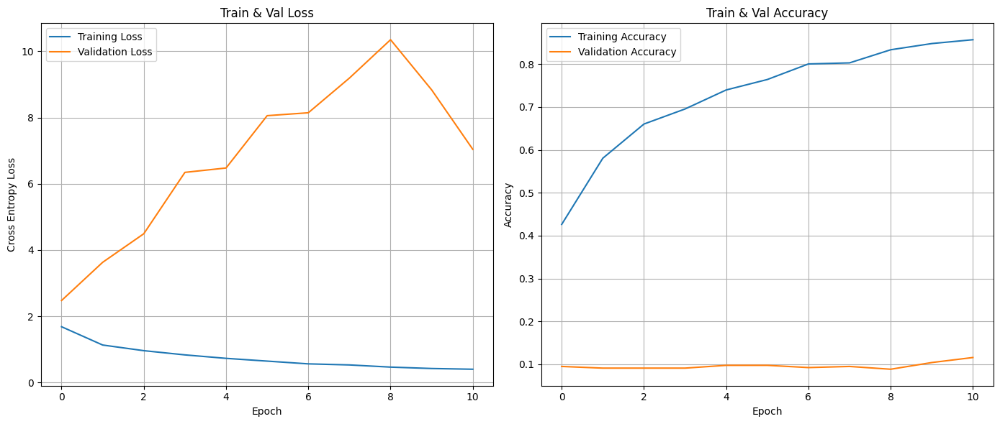

6/6 [==============================] - 0s 20ms/step - loss: 2.4367 - accuracy: 0.0964


Nodes: 64, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 16


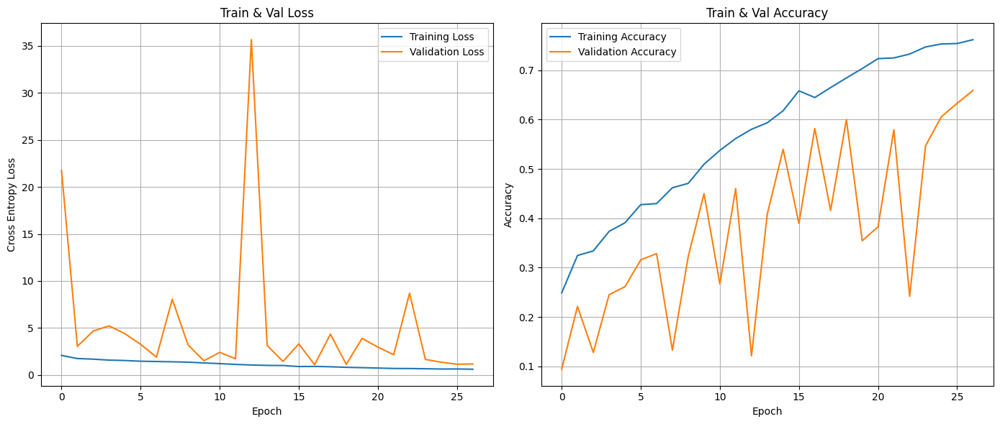

55/55 [==============================] - 0s 4ms/step - loss: 1.1120 - accuracy: 0.5784


Nodes: 64, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 32


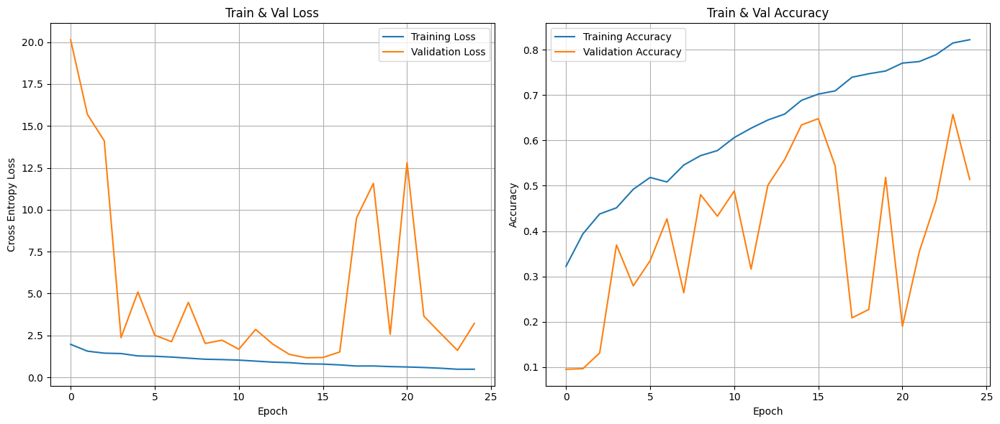

27/27 [==============================] - 0s 6ms/step - loss: 1.1518 - accuracy: 0.6319


Nodes: 64, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 128


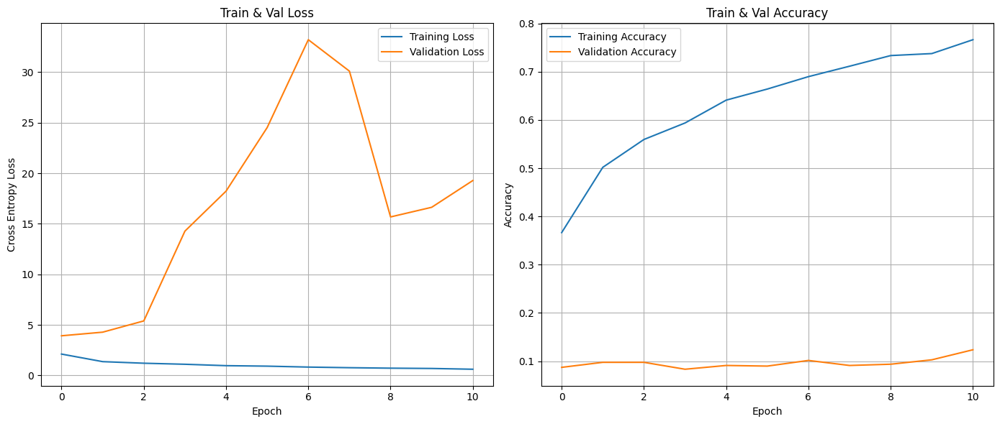

6/6 [==============================] - 0s 20ms/step - loss: 3.9261 - accuracy: 0.0964


Nodes: 64, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 16


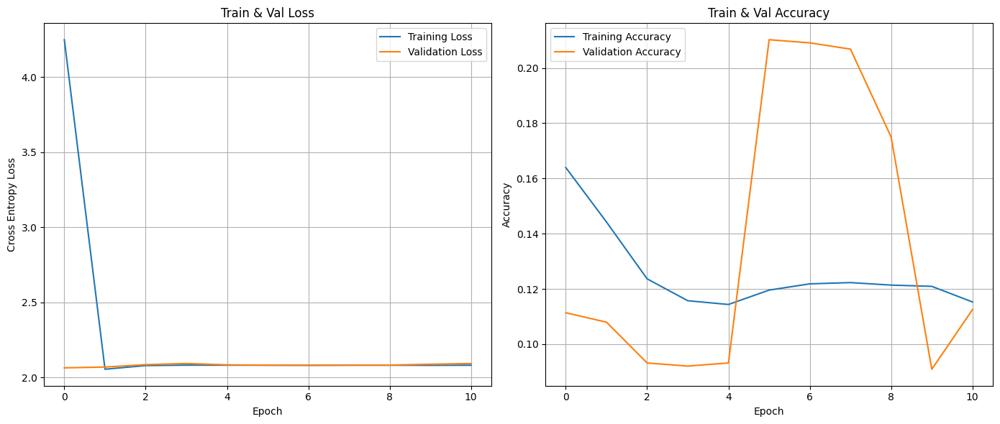

55/55 [==============================] - 0s 4ms/step - loss: 2.0642 - accuracy: 0.1080


Nodes: 64, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 32


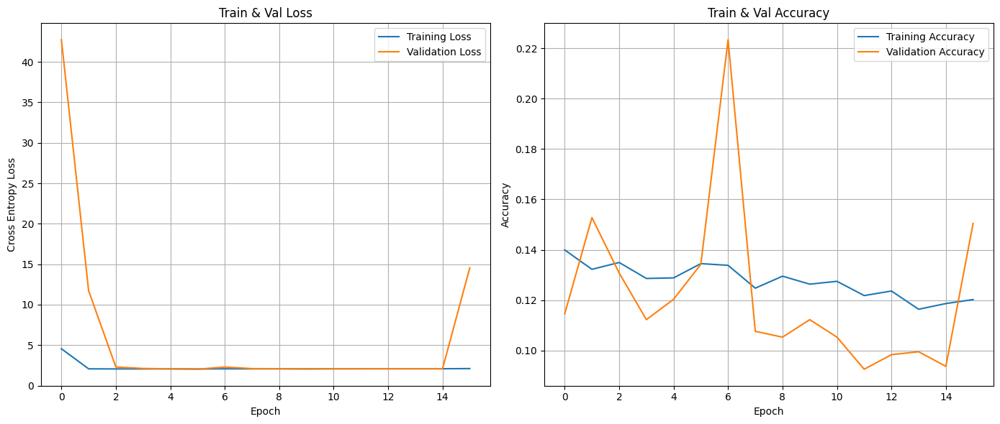

27/27 [==============================] - 0s 6ms/step - loss: 2.0188 - accuracy: 0.1389


Nodes: 64, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 128


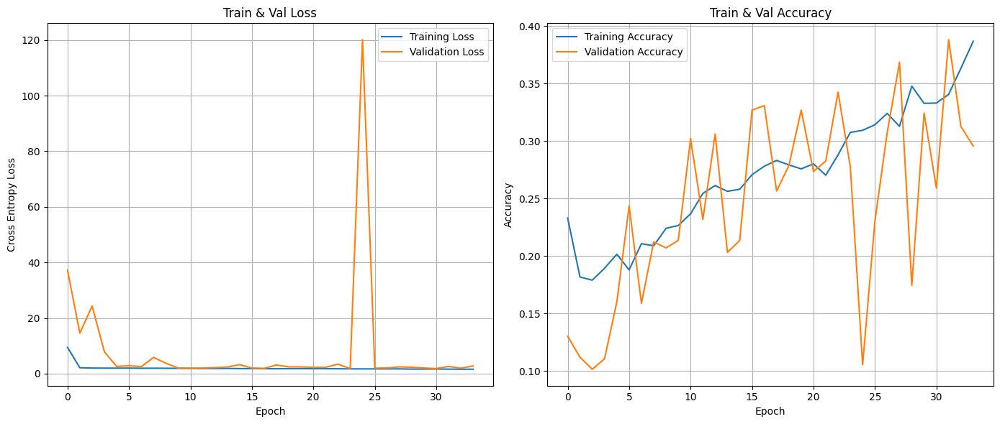

6/6 [==============================] - 0s 20ms/step - loss: 1.7981 - accuracy: 0.2812


Nodes: 64, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 16


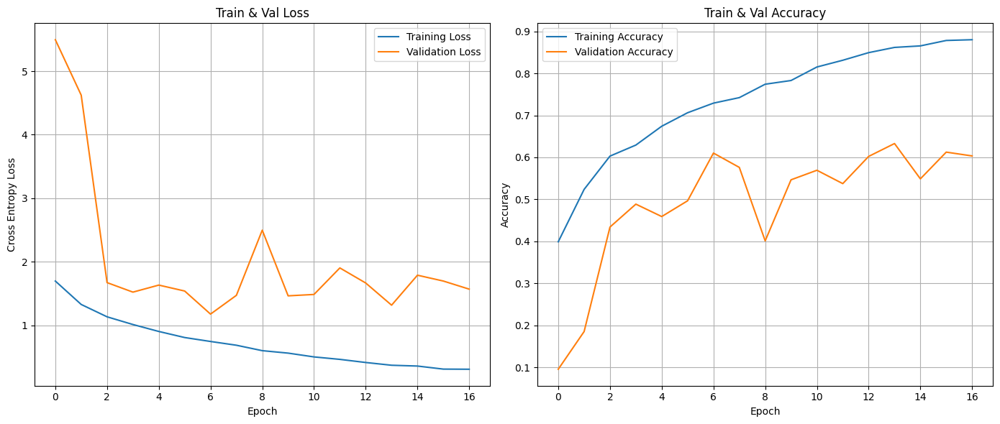

55/55 [==============================] - 0s 4ms/step - loss: 1.1875 - accuracy: 0.6091


Nodes: 64, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 32


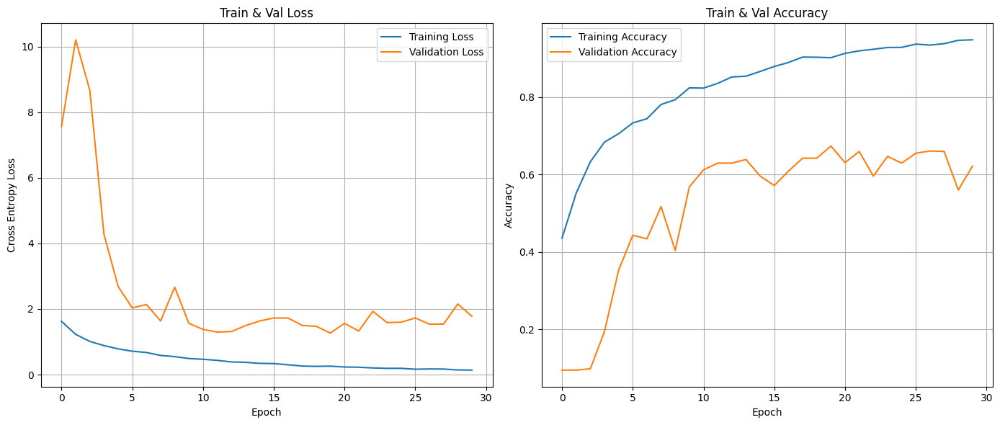

27/27 [==============================] - 0s 6ms/step - loss: 1.2631 - accuracy: 0.6759


Nodes: 64, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 128


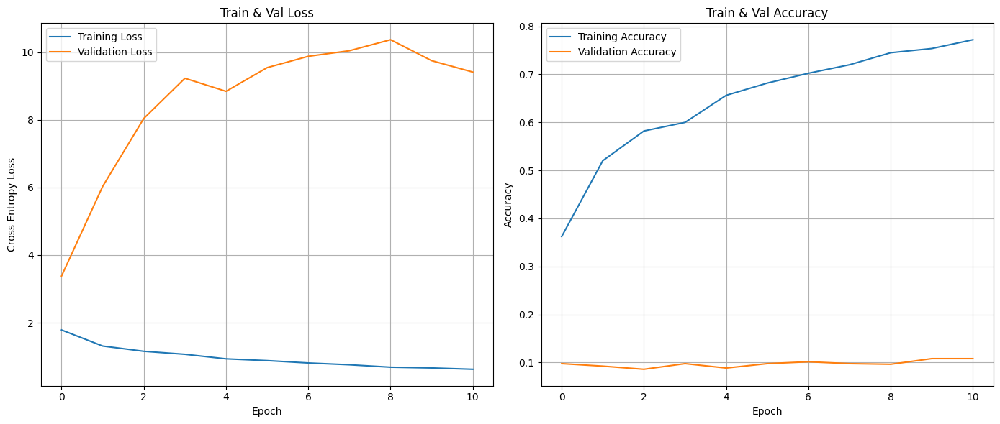

6/6 [==============================] - 0s 20ms/step - loss: 3.4286 - accuracy: 0.0911


Nodes: 64, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 16


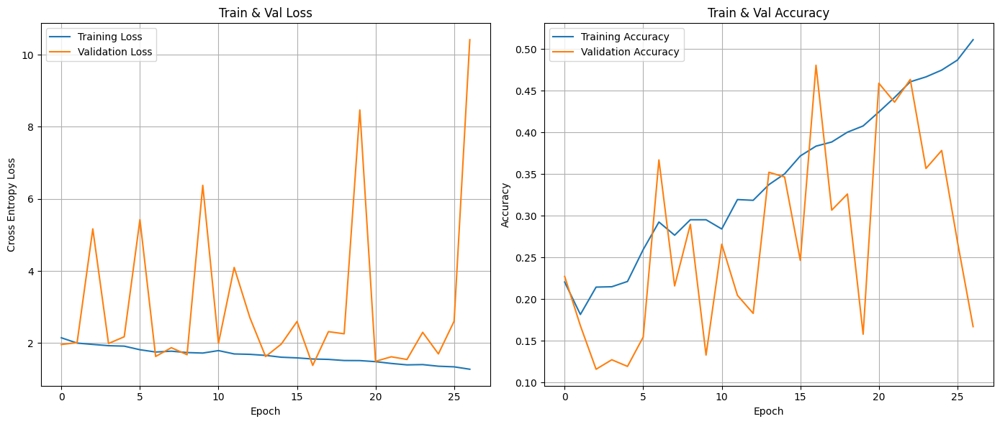

55/55 [==============================] - 0s 4ms/step - loss: 1.3779 - accuracy: 0.4818


Nodes: 64, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 32


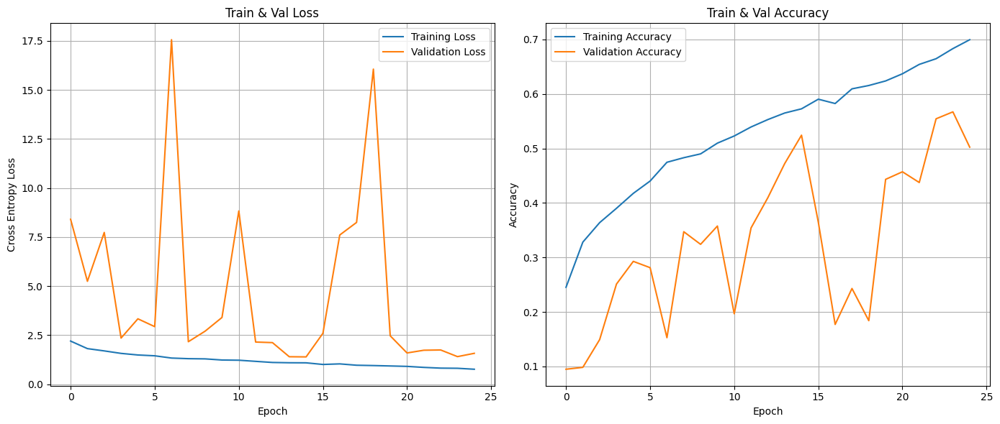

27/27 [==============================] - 0s 6ms/step - loss: 1.3918 - accuracy: 0.5220


Nodes: 64, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 128


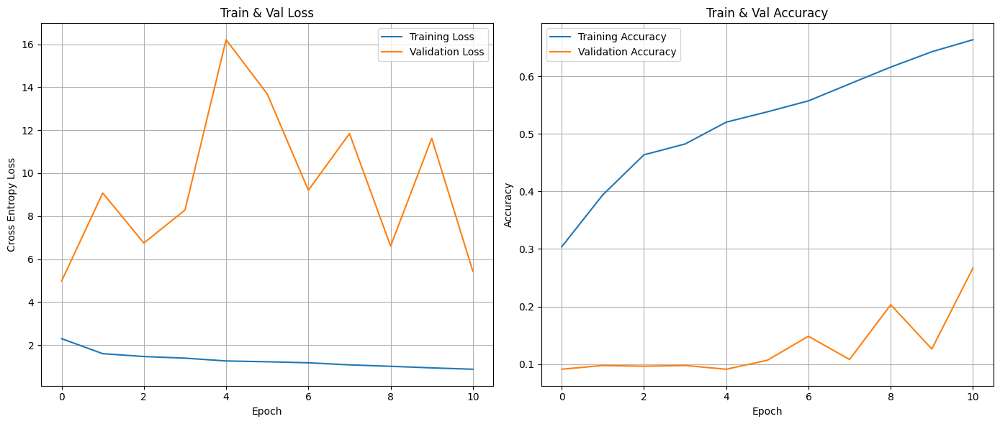

6/6 [==============================] - 0s 20ms/step - loss: 4.9477 - accuracy: 0.0872


Nodes: 64, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 16


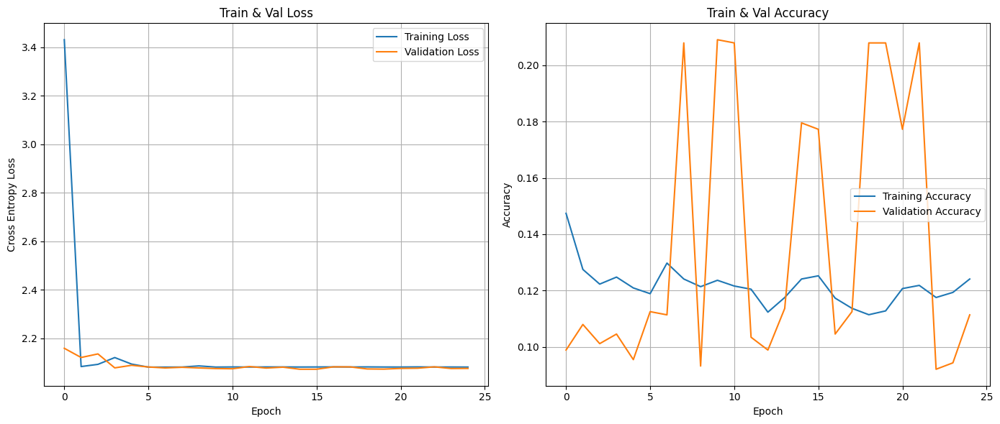

55/55 [==============================] - 0s 4ms/step - loss: 2.0726 - accuracy: 0.1784


Nodes: 64, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 32


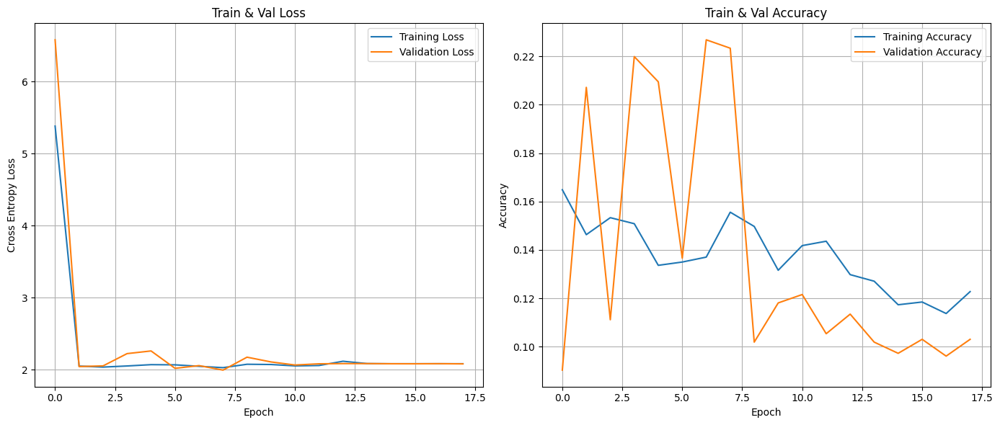

27/27 [==============================] - 0s 6ms/step - loss: 1.9925 - accuracy: 0.2245


Nodes: 64, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 128


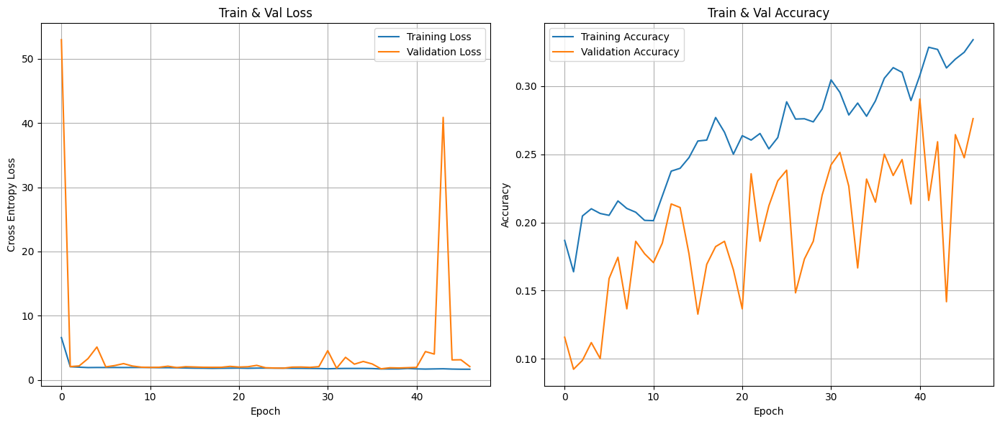

6/6 [==============================] - 0s 20ms/step - loss: 1.7811 - accuracy: 0.2565


Nodes: 128, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 16


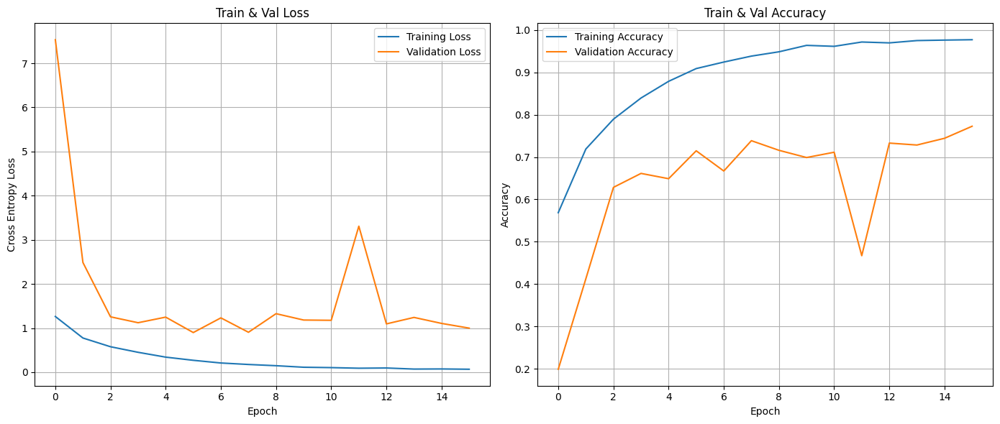

55/55 [==============================] - 0s 4ms/step - loss: 0.8950 - accuracy: 0.7148


Nodes: 128, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 32


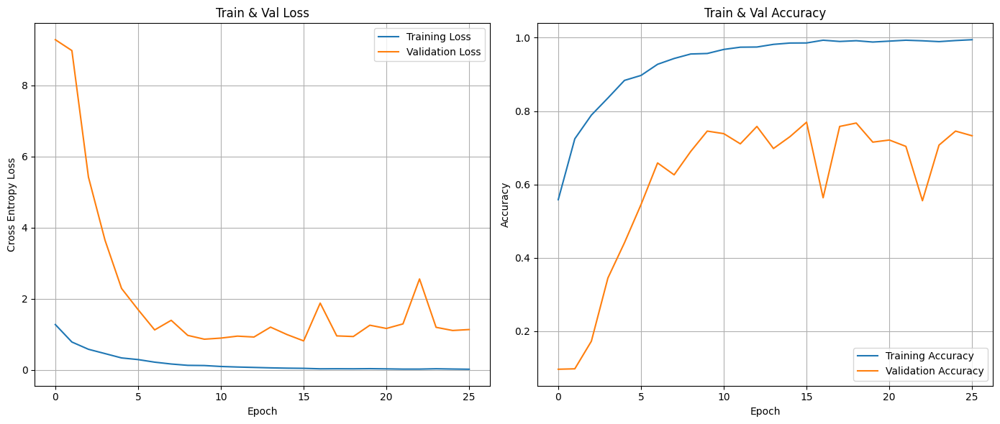

27/27 [==============================] - 0s 6ms/step - loss: 0.8348 - accuracy: 0.7650


Nodes: 128, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 128


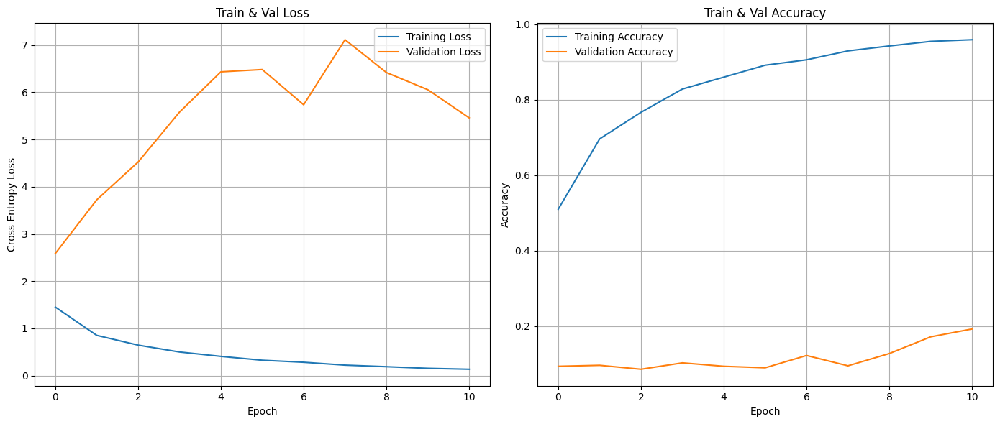

6/6 [==============================] - 0s 20ms/step - loss: 2.6001 - accuracy: 0.0938


Nodes: 128, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 16


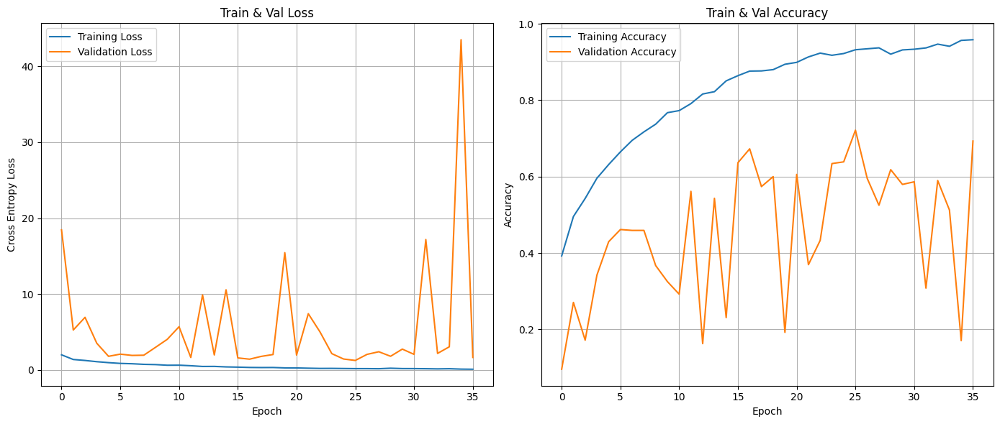

55/55 [==============================] - 0s 4ms/step - loss: 1.2718 - accuracy: 0.7216


Nodes: 128, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 32


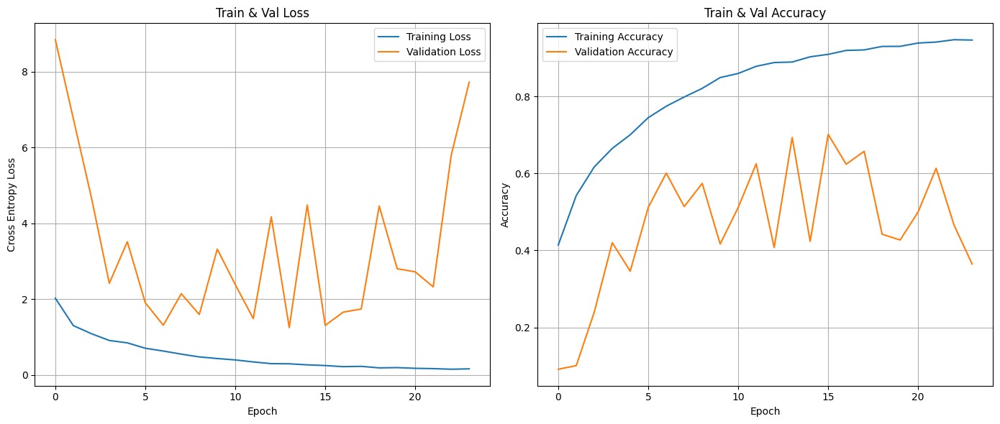

27/27 [==============================] - 0s 6ms/step - loss: 1.2435 - accuracy: 0.6968


Nodes: 128, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 128


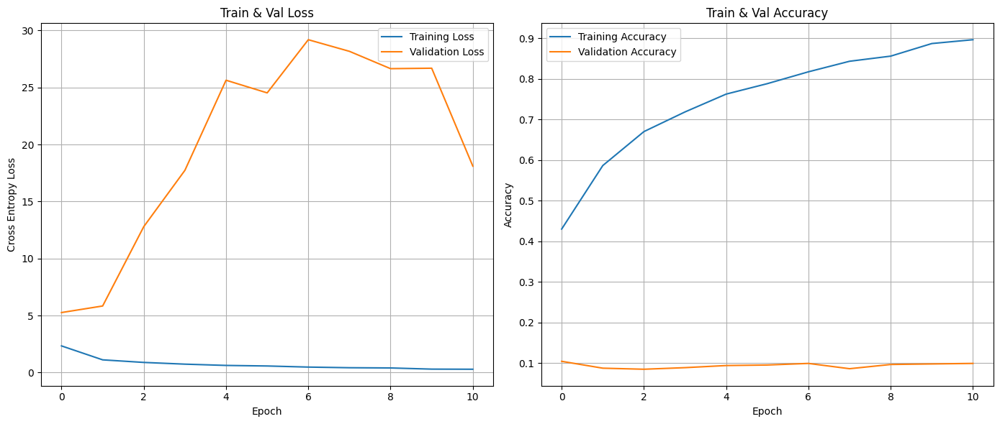

6/6 [==============================] - 0s 20ms/step - loss: 5.2469 - accuracy: 0.1055


Nodes: 128, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 16


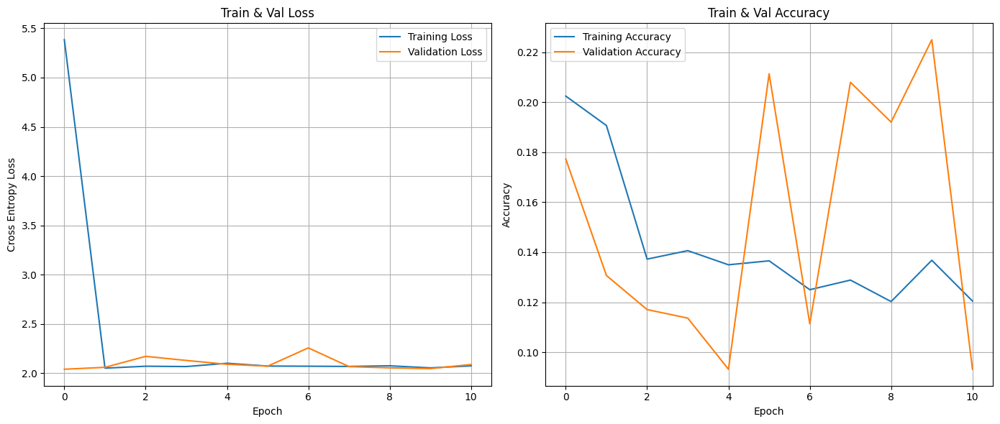

55/55 [==============================] - 0s 4ms/step - loss: 2.0386 - accuracy: 0.1807


Nodes: 128, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 32


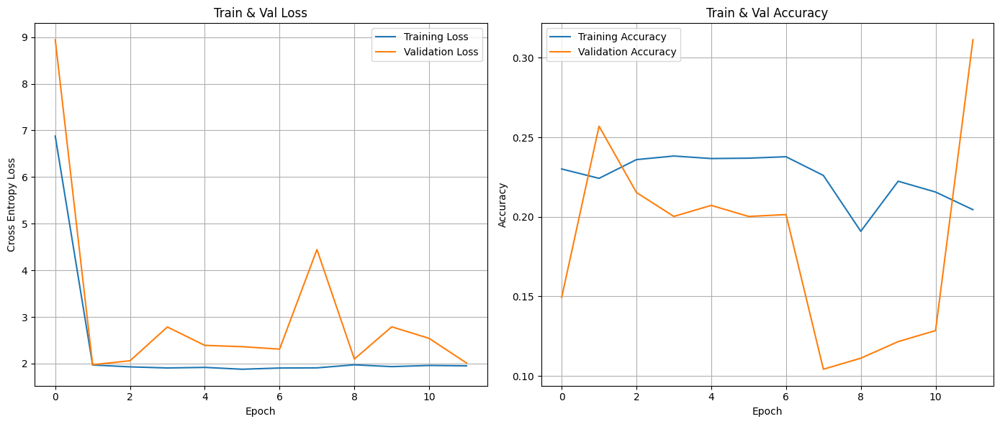

27/27 [==============================] - 0s 6ms/step - loss: 1.9755 - accuracy: 0.2523


Nodes: 128, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 128


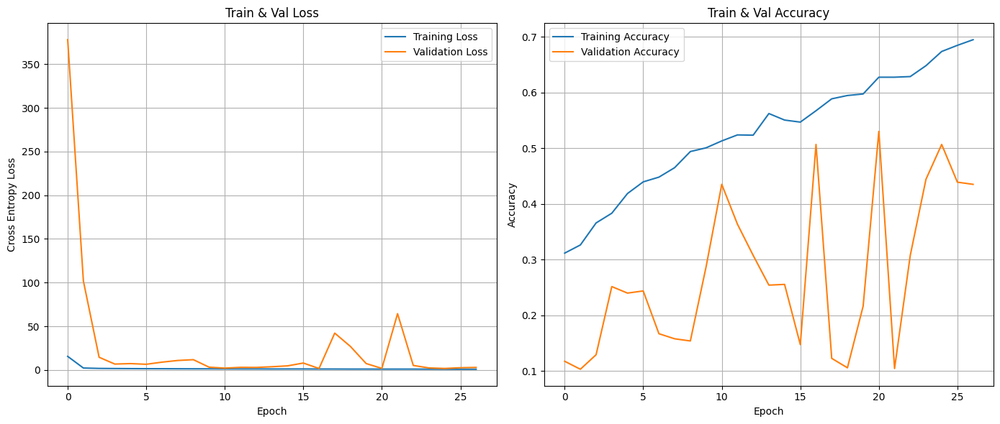

6/6 [==============================] - 0s 20ms/step - loss: 1.6809 - accuracy: 0.5013


Nodes: 128, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 16


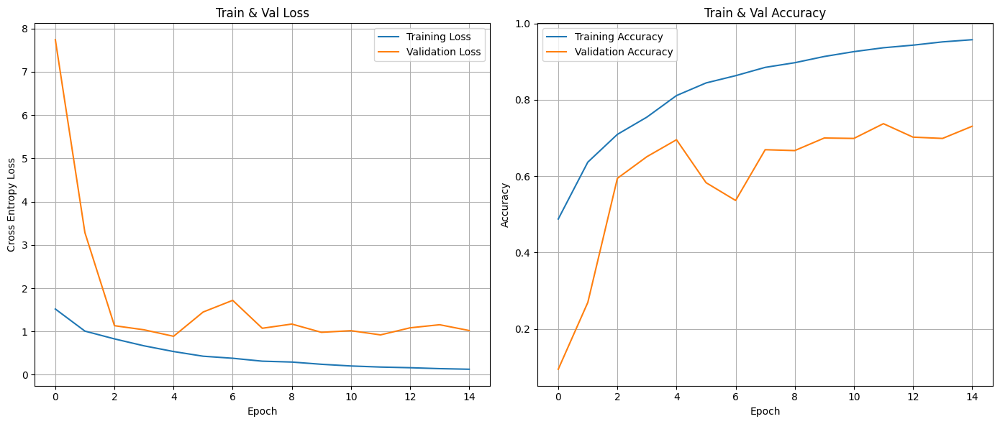

55/55 [==============================] - 0s 4ms/step - loss: 0.8815 - accuracy: 0.6977


Nodes: 128, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 32


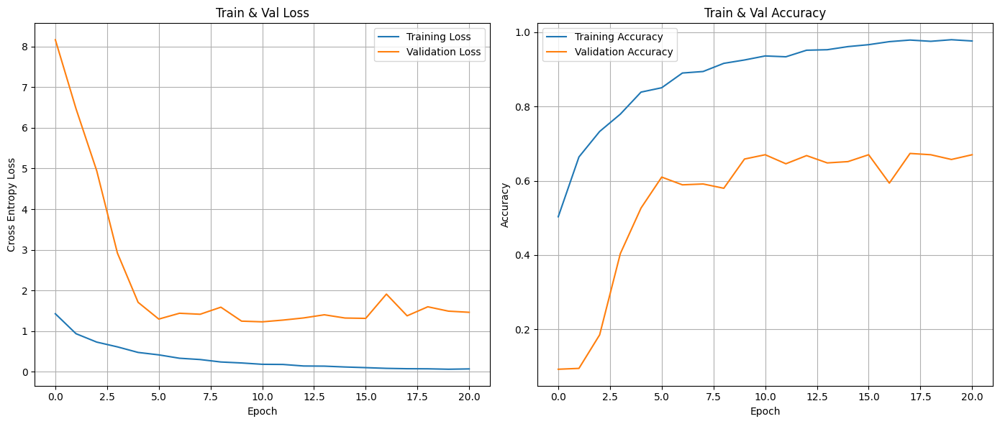

27/27 [==============================] - 0s 6ms/step - loss: 1.2234 - accuracy: 0.6736


Nodes: 128, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 128


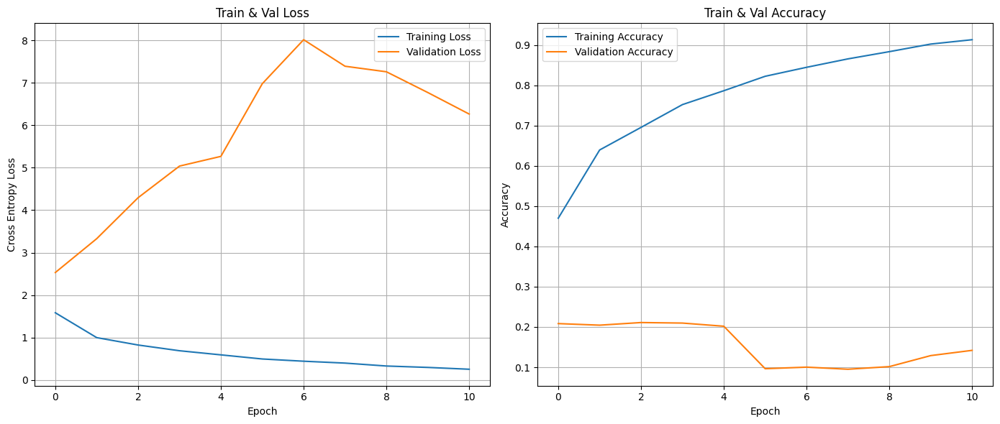

6/6 [==============================] - 0s 20ms/step - loss: 2.5411 - accuracy: 0.1992


Nodes: 128, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 16


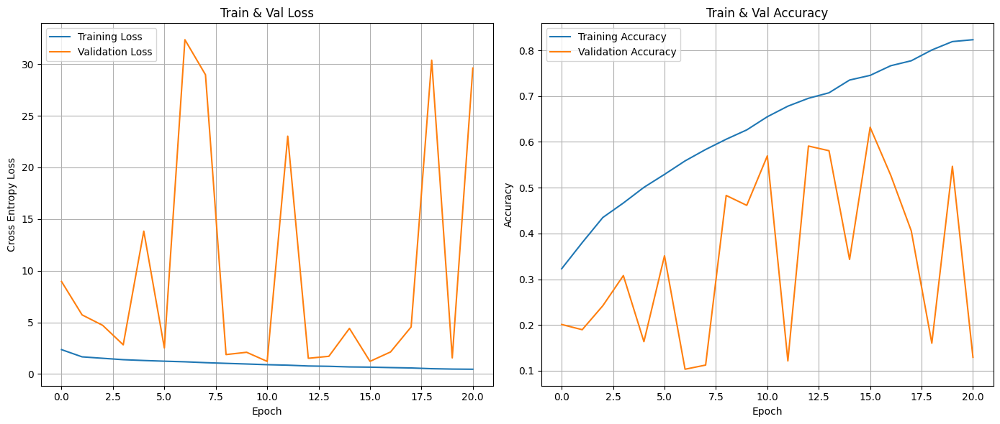

55/55 [==============================] - 0s 4ms/step - loss: 1.2235 - accuracy: 0.5659


Nodes: 128, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 32


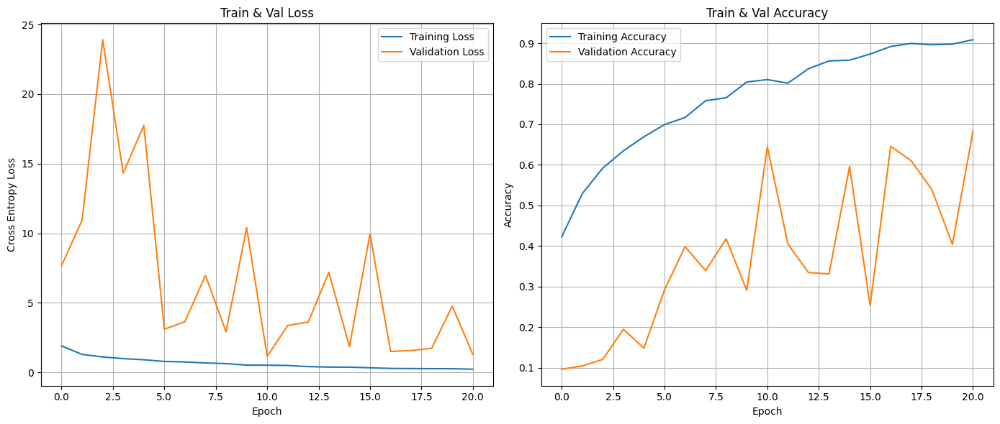

27/27 [==============================] - 0s 6ms/step - loss: 1.1729 - accuracy: 0.6447


Nodes: 128, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 128


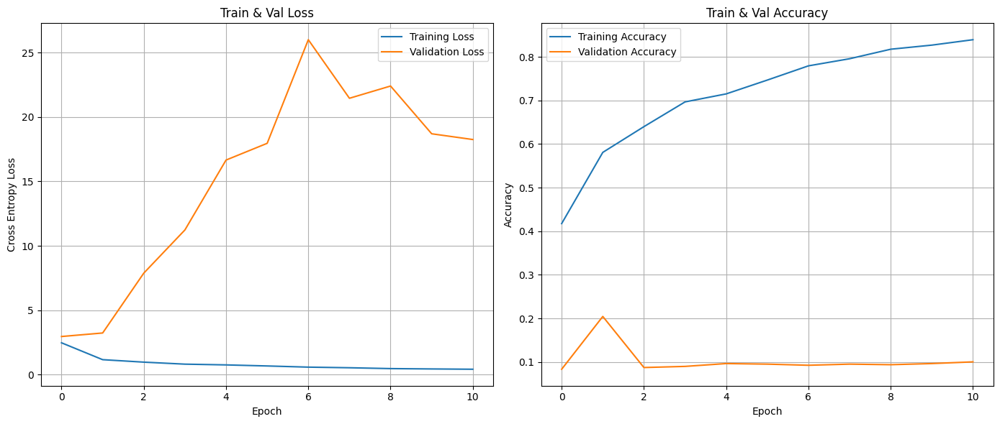

6/6 [==============================] - 0s 20ms/step - loss: 2.9412 - accuracy: 0.0924


Nodes: 128, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 16


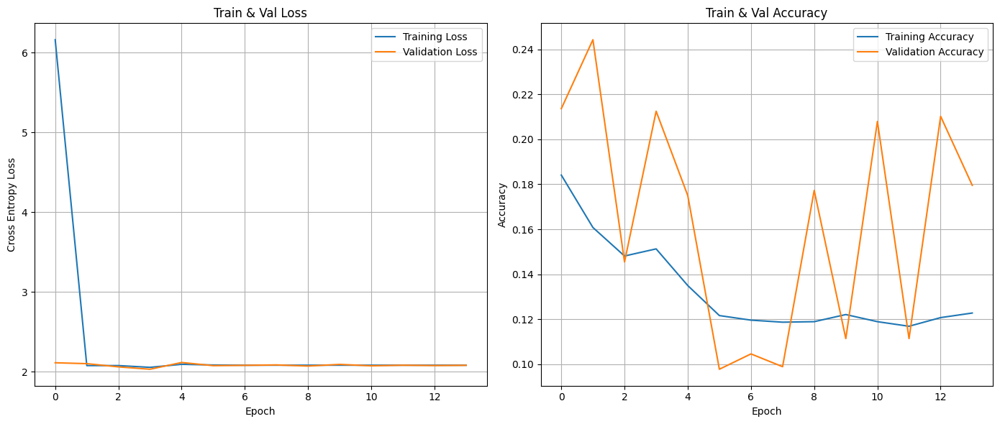

55/55 [==============================] - 0s 4ms/step - loss: 2.0311 - accuracy: 0.2125


Nodes: 128, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 32


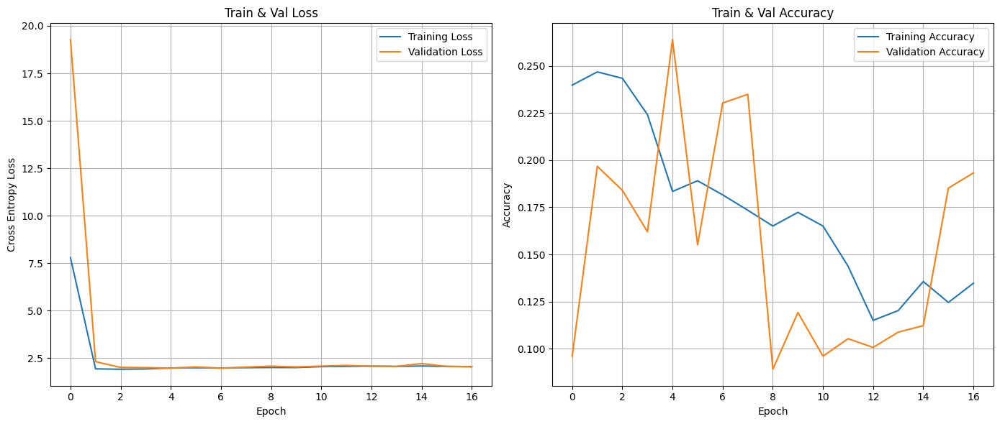

27/27 [==============================] - 0s 6ms/step - loss: 1.9753 - accuracy: 0.2315


Nodes: 128, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 128


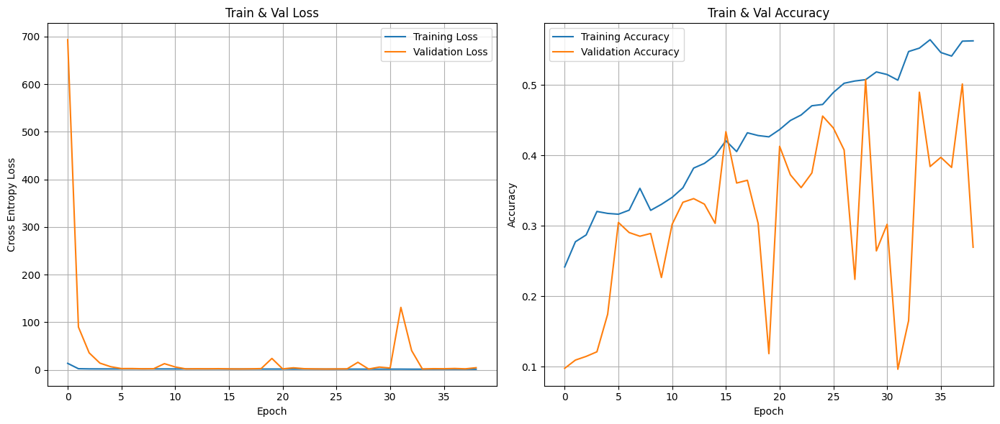

6/6 [==============================] - 0s 20ms/step - loss: 1.5645 - accuracy: 0.5130


Nodes: 128, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 16


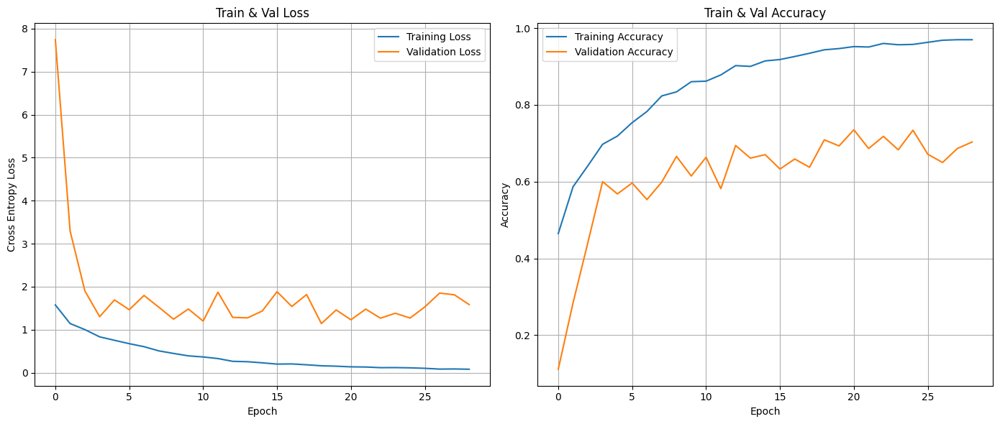

55/55 [==============================] - 0s 4ms/step - loss: 1.1438 - accuracy: 0.7080


Nodes: 128, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 32


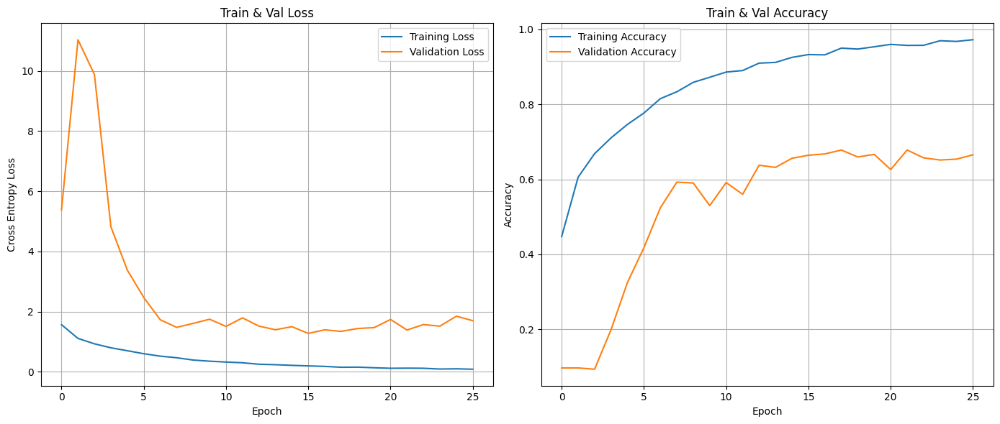

27/27 [==============================] - 0s 6ms/step - loss: 1.2594 - accuracy: 0.6701


Nodes: 128, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 128


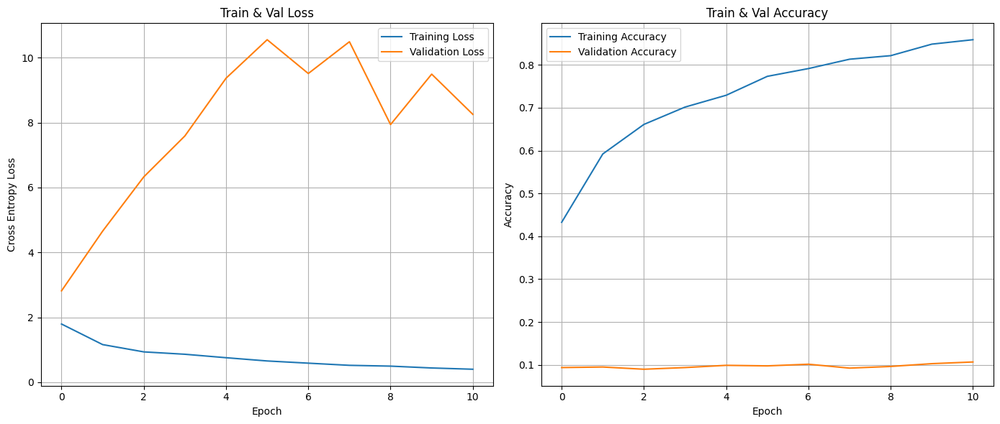

6/6 [==============================] - 0s 20ms/step - loss: 2.8013 - accuracy: 0.0977


Nodes: 128, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 16


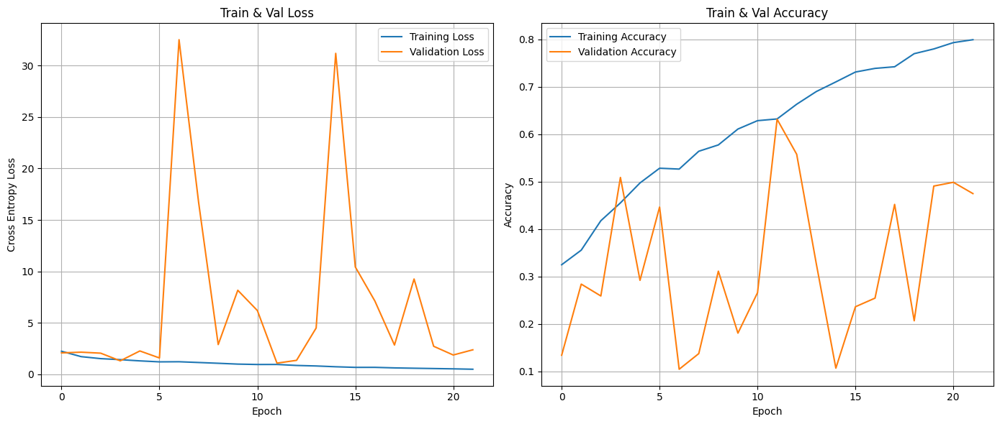

55/55 [==============================] - 0s 4ms/step - loss: 1.0914 - accuracy: 0.6318


Nodes: 128, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 32


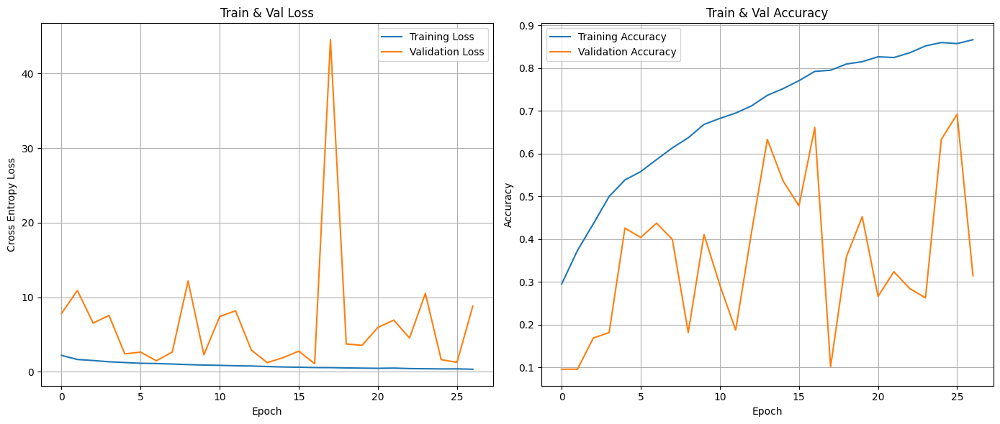

27/27 [==============================] - 0s 6ms/step - loss: 1.0438 - accuracy: 0.6667


Nodes: 128, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 128


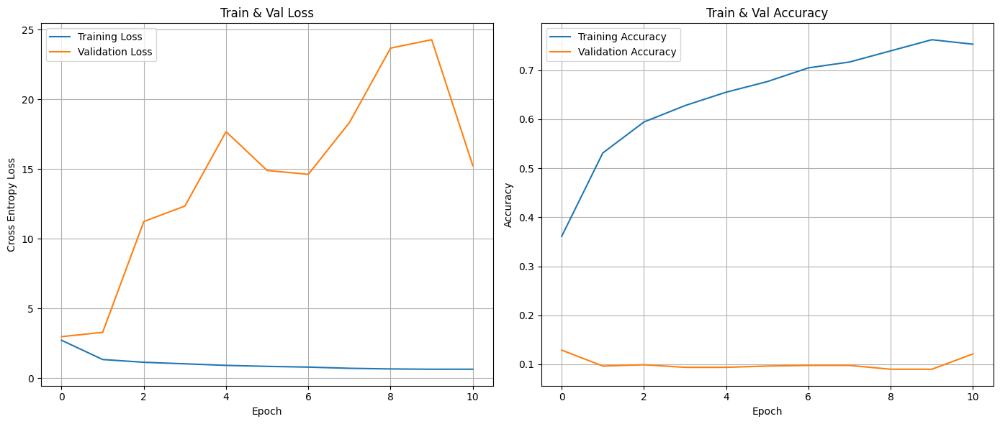

6/6 [==============================] - 0s 20ms/step - loss: 3.0068 - accuracy: 0.1250


Nodes: 128, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 16


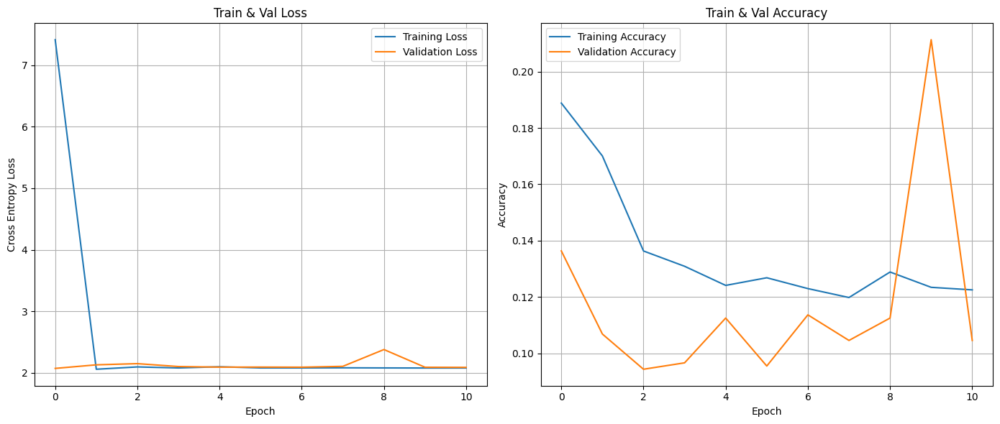

55/55 [==============================] - 0s 4ms/step - loss: 2.0735 - accuracy: 0.1330


Nodes: 128, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 32


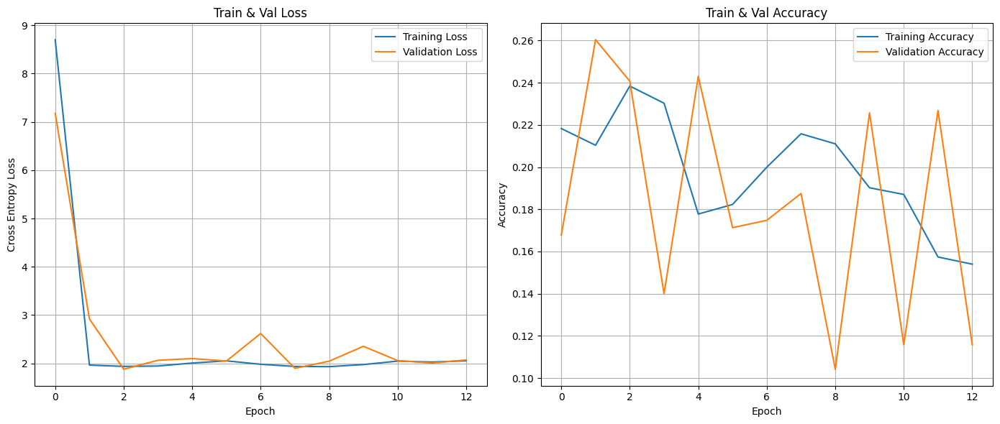

27/27 [==============================] - 0s 6ms/step - loss: 1.8766 - accuracy: 0.2431


Nodes: 128, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 128


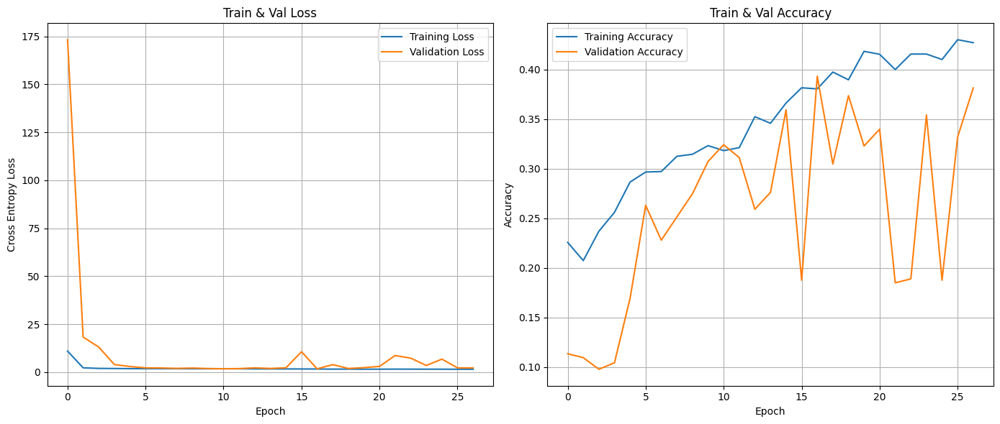

6/6 [==============================] - 0s 20ms/step - loss: 1.7151 - accuracy: 0.3867
Best validation loss: 0.8348
Test accuracy: 0.7396


In [16]:
# Run the test
best_model, best_history, best_test_loss, best_test_accuracy = find_best_model(
    X_train, y_train, X_valid, y_valid, X_test, y_test, epochs=100
)

# Validation

#### KFold 

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.KFold.html

"Provides train/test indices to split data in train/test sets. Split dataset into k consecutive folds (without shuffling by default).

Each fold is then used once as a validation while the k - 1 remaining folds form the training set."

In [62]:
def k_fold_validation(
    X: np.ndarray,
    y: np.ndarray,
    num_folds: int = 5,
    epochs: int = 100,
    batch_size: int = 32,
    num_nodes: int = 64,
    dropout_prob: float = 0.3,
    learning_rate: float = 0.0001,
) -> Dict[str, Any]:
    """
    Performs k-fold cross-validation on the dataset.

    Args:
        X (numpy.ndarray): Image dataset.
        y (numpy.ndarray): Labels dataset.
        num_folds (int): Number of folds. Defaults to 5.
        epochs (int): Number of epochs. Defaults to 100.
        batch_size (int): Batch size for training. Defaults to 32.
        num_nodes (int): Number of nodes. Defaults to 64.
        dropout_prob (float): Dropout probability. Defaults to 0.3.
        learning_rate (float): Learning rate. Defaults to 0.0001.

    Returns:
        dict: A dictionary containing the training and validation loss and accuracy for each fold.
    """

    # Convert data to float32 to reduce memory usage
    X = X.astype("float32")

    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
    k_fold_metrics = {
        "train_loss": [],
        "train_accuracy": [],
        "val_loss": [],
        "val_accuracy": [],
        "val_f1": [],
        "val_recall": [],
    }

    fold_no = 1
    for train_index, val_index in kf.split(X):
        print(f"Fold {fold_no}")

        # Create data generators
        training_generator = DataGenerator(
            X[train_index], y[train_index], batch_size=batch_size
        )
        validation_generator = DataGenerator(
            X[val_index], y[val_index], batch_size=batch_size
        )

        # Build and compile model
        model = build_model(
            num_nodes=num_nodes, dropout_prob=dropout_prob, learning_rate=learning_rate
        )

        # Define early stopping
        early_stopping = EarlyStopping(
            monitor="val_loss", patience=10, restore_best_weights=True
        )

        # Train model with early stopping and learning rate scheduler callbacks
        history = model.fit(
            training_generator,
            epochs=epochs,
            validation_data=validation_generator,
            callbacks=[early_stopping],
        )

        # Evaluate model
        train_loss, train_accuracy = model.evaluate(training_generator)
        val_loss, val_accuracy = model.evaluate(validation_generator)

        # Predict validation data
        steps = len(validation_generator)
        val_predictions = model.predict(validation_generator, steps=steps)
        val_predictions = np.argmax(val_predictions, axis=1)

        # Ensure lengths match
        y_val = y[val_index][: len(val_predictions)]

        # Check lengths to debug
        print(
            f"Length of val_index: {len(val_index)}, Length of val_predictions: {len(val_predictions)}, Length of y_val: {len(y_val)}"
        )

        # Calculate F1 score and recall
        if len(y_val) == len(val_predictions):
            val_f1_score = f1_score(y_val, val_predictions, average="weighted")
            val_recall = recall_score(y_val, val_predictions, average="weighted")

            # Append metrics
            k_fold_metrics["train_loss"].append(train_loss)
            k_fold_metrics["train_accuracy"].append(train_accuracy)
            k_fold_metrics["val_loss"].append(val_loss)
            k_fold_metrics["val_accuracy"].append(val_accuracy)
            k_fold_metrics["val_f1"].append(val_f1_score)
            k_fold_metrics["val_recall"].append(val_recall)

            print(
                f"Fold {fold_no} - Train Loss: {train_loss}, Train Accuracy: {train_accuracy}"
            )
            print(
                f"Fold {fold_no} - Val Loss: {val_loss}, Val Accuracy: {val_accuracy}"
            )
            print(
                f"Fold {fold_no} - Val F1 Score: {val_f1_score}, Val Recall: {val_recall}"
            )
        else:
            print(
                f"Error: Length mismatch between y[val_index] and val_predictions for Fold {fold_no}"
            )

        # Clear session and delete model to free up memory
        backend.clear_session()
        del model, history, training_generator, validation_generator
        gc.collect()

        fold_no += 1

    # Calculate average metrics across all folds
    avg_train_loss = np.mean(k_fold_metrics["train_loss"])
    avg_train_accuracy = np.mean(k_fold_metrics["train_accuracy"])
    avg_val_loss = np.mean(k_fold_metrics["val_loss"])
    avg_val_accuracy = np.mean(k_fold_metrics["val_accuracy"])
    avg_val_f1 = np.mean(k_fold_metrics["val_f1"])
    avg_val_recall = np.mean(k_fold_metrics["val_recall"])

    # Print average metrics
    print(
        f"Average Train Loss: {avg_train_loss}, Average Train Accuracy: {avg_train_accuracy}"
    )
    print(f"Average Val Loss: {avg_val_loss}, Average Val Accuracy: {avg_val_accuracy}")
    print(f"Average Val F1 Score: {avg_val_f1}, Average Val Recall: {avg_val_recall}")

    return k_fold_metrics


# Define best_params dict from best_model above
best_params = {
    "num_nodes": 128,
    "dropout_prob": 0.2,
    "learning_rate": 0.0001,
    "batch_size": 32,
}

# Run k-fold validation
k_fold_metrics = k_fold_validation(X, y, num_folds=5, epochs=100, **best_params)

Fold 1
Epoch 1/100
110/110 [==============================] - 4s 30ms/step - loss: 1.5130 - accuracy: 0.4920 - val_loss: 4.9831 - val_accuracy: 0.0880
Epoch 2/100
110/110 [==============================] - 3s 29ms/step - loss: 0.9816 - accuracy: 0.6446 - val_loss: 6.7773 - val_accuracy: 0.0880
Epoch 3/100
110/110 [==============================] - 3s 29ms/step - loss: 0.8196 - accuracy: 0.7065 - val_loss: 10.0933 - val_accuracy: 0.0868
Epoch 4/100
110/110 [==============================] - 3s 29ms/step - loss: 0.6728 - accuracy: 0.7628 - val_loss: 7.6597 - val_accuracy: 0.1042
Epoch 5/100
110/110 [==============================] - 3s 29ms/step - loss: 0.5668 - accuracy: 0.7986 - val_loss: 5.3307 - val_accuracy: 0.2546
Epoch 6/100
110/110 [==============================] - 3s 28ms/step - loss: 0.4847 - accuracy: 0.8193 - val_loss: 2.3219 - val_accuracy: 0.4317
Epoch 7/100
110/110 [==============================] - 3s 28ms/step - loss: 0.4234 - accuracy: 0.8483 - val_loss: 1.3620 - val_a

#### Plot K-fold Results

Top Left (Train and Validation Loss per Fold):

Top Right (Train and Validation Accuracy per Fold):

Bottom Left (Average Train and Validation Loss):

Bottom Right (Average Train and Validation Accuracy):

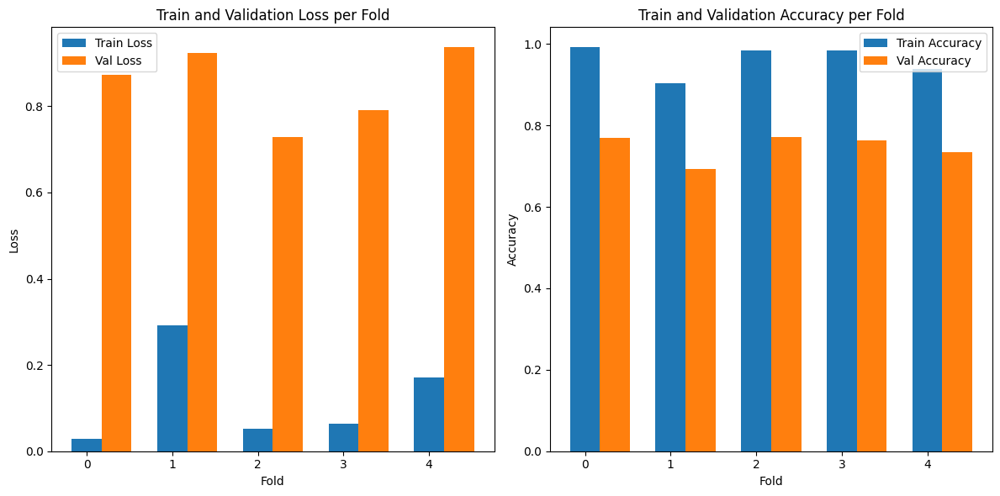

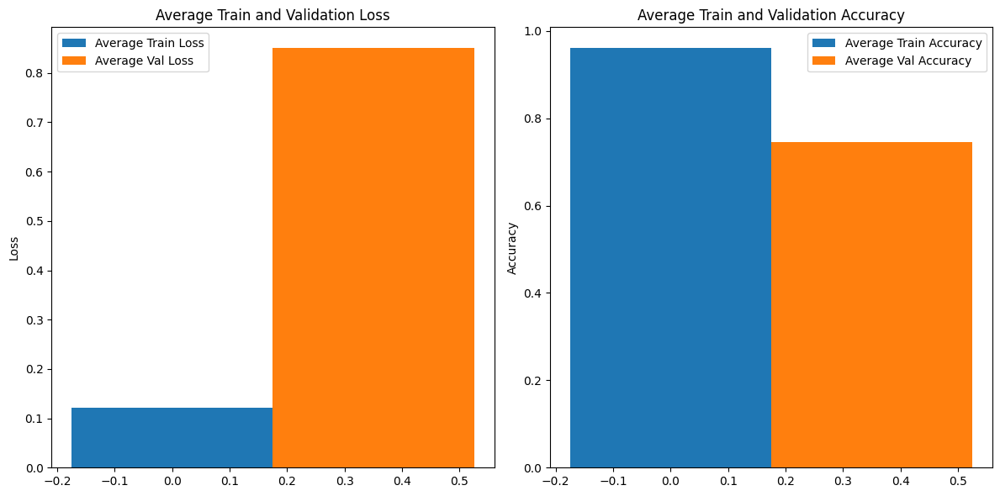

In [64]:
def plot_k_fold_metrics(k_fold_metrics: Dict[str, Any]) -> None:
    num_folds = len(k_fold_metrics["train_loss"])  # Number of folds

    # Plot train and validation loss for each fold
    plt.figure(figsize=(12, 6))

    # Extract the single values for each fold
    train_losses = k_fold_metrics["train_loss"]
    val_losses = k_fold_metrics["val_loss"]
    train_accuracies = k_fold_metrics["train_accuracy"]
    val_accuracies = k_fold_metrics["val_accuracy"]

    bar_width = 0.35  # Width of the bars

    # Create subplots for loss and accuracy
    plt.subplot(1, 2, 1)
    r1 = np.arange(num_folds)
    r2 = [x + bar_width for x in r1]
    plt.bar(r1, train_losses, width=bar_width, label="Train Loss")
    plt.bar(r2, val_losses, width=bar_width, label="Val Loss")
    plt.title("Train and Validation Loss per Fold")
    plt.xlabel("Fold")
    plt.ylabel("Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    r1 = np.arange(num_folds)
    r2 = [x + bar_width for x in r1]
    plt.bar(r1, train_accuracies, width=bar_width, label="Train Accuracy")
    plt.bar(r2, val_accuracies, width=bar_width, label="Val Accuracy")
    plt.title("Train and Validation Accuracy per Fold")
    plt.xlabel("Fold")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Find average metrics across all folds
    avg_train_loss = np.mean(train_losses)
    avg_val_loss = np.mean(val_losses)
    avg_train_accuracy = np.mean(train_accuracies)
    avg_val_accuracy = np.mean(val_accuracies)

    # Plot average train and validation loss and accuracy
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    r1 = [0]
    r2 = [x + bar_width for x in r1]
    plt.bar(r1, [avg_train_loss], width=bar_width, label="Average Train Loss")
    plt.bar(r2, [avg_val_loss], width=bar_width, label="Average Val Loss")
    plt.title("Average Train and Validation Loss")
    plt.ylabel("Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    r1 = [0]
    r2 = [x + bar_width for x in r1]
    plt.bar(r1, [avg_train_accuracy], width=bar_width, label="Average Train Accuracy")
    plt.bar(r2, [avg_val_accuracy], width=bar_width, label="Average Val Accuracy")
    plt.title("Average Train and Validation Accuracy")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()


# Plot the k-fold metrics
plot_k_fold_metrics(k_fold_metrics)

# Results

### Best History Graph

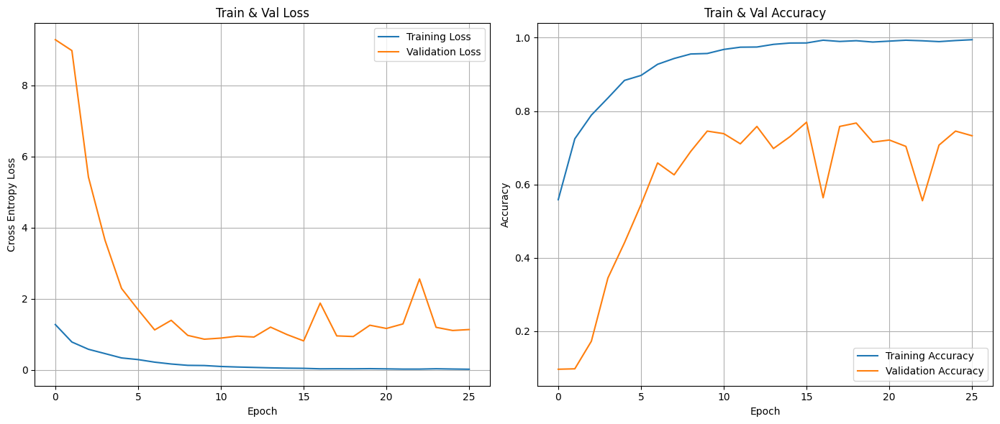

In [19]:
# Plot the best history
plot_history(best_history)

### Accuracy with Test Set

In [20]:
# Evaluate the best model with the test data
test_loss, test_accuracy = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")

Test Loss: 0.9327
Test accuracy: 0.7362


### Predictions of Test Set

In [21]:
# Predict the classes for the test set
y_pred_prob = best_model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

28/28 [==============================] - 0s 5ms/step


### Classification Report

In [22]:
# Classification report
print("Classification Report:")
print(
    classification_report(
        y_test, y_pred, target_names=[class_names[i] for i in range(len(class_names))]
    )
)

Classification Report:
              precision    recall  f1-score   support

   Cardboard       0.81      0.61      0.70        93
Food Organic       0.77      0.80      0.79        82
       Glass       0.71      0.89      0.79        84
       Metal       0.75      0.71      0.73       158
       Misc.       0.54      0.64      0.59        99
       Paper       0.72      0.75      0.74       100
     Plastic       0.78      0.71      0.74       184
  Vegetation       0.83      0.85      0.84        87

    accuracy                           0.74       887
   macro avg       0.74      0.75      0.74       887
weighted avg       0.74      0.74      0.74       887


### Confusion Matrix

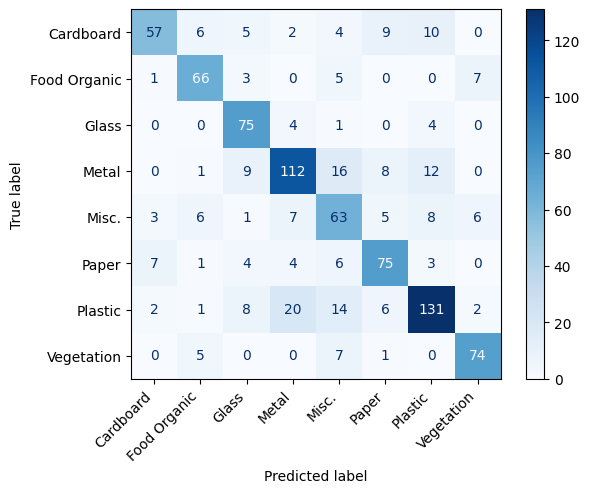

In [23]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(
    confusion_matrix=conf_matrix,
    display_labels=[class_names[i] for i in range(len(class_names))],
)
disp.plot(cmap=plt.cm.Blues)
# Rotate x-axis labels
plt.xticks(rotation=45, ha="right")
plt.show()

### Prediction Visualization

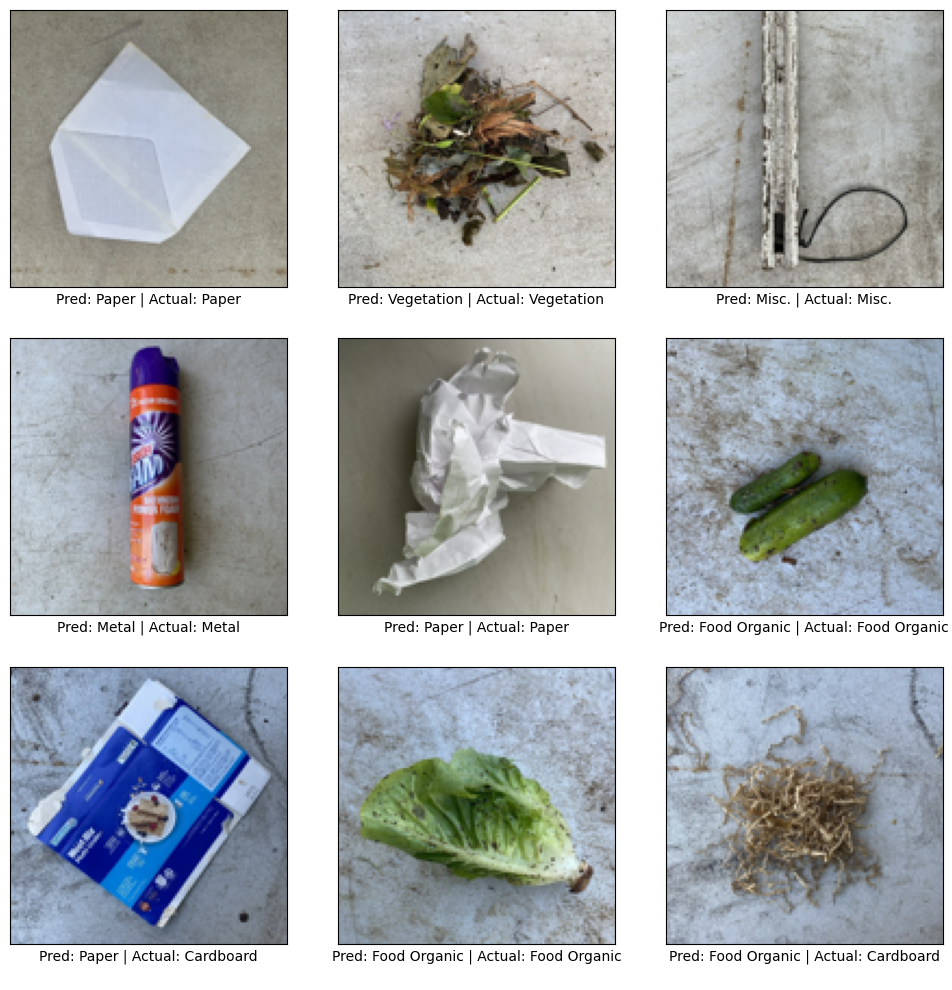

In [24]:
# Select a random set of 9 test images
idx = np.random.randint(len(X_test) - 9)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(X_test[idx + i])
    plt.xlabel(
        "Pred: {} | Actual: {}\n".format(
            class_names[np.argmax(y_pred_prob[idx + i])], class_names[y_test[idx + i]]
        )
    )
    plt.xticks([])
    plt.yticks([])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

#### Save Model

In [25]:
best_model.save("TrashClassifier_best_model.h5")